# MediSina Scan — MobileNetV2: Pharmaceutical Drug Image Classification

**Thesis Project | Lightweight On-Device Pharmaceutical Image Classifier**

**Dataset:** Pharmaceutical Drugs and Vitamins Synthetic Images (vencerlanz09) with a Real-World Test Set
**Model:** MobileNetV2 (Sandler et al., 2018) — Inverted-Residual Convolutional Neural Network
**Classes:** 10 Philippine over-the-counter pharmaceutical drugs and vitamins
**Data Split:** 70% Training / 15% Validation / 15% Synthetic Test (stratified) + Real-World Test Set (300 images)

This notebook trains and evaluates a MobileNetV2 classifier for ten common Philippine
over-the-counter medicines, then exports a TensorFlow Lite model for the MediSina Scan
mobile application. It is organised end to end: configuration, dataset preparation,
preprocessing and augmentation, model construction, two-phase training, evaluation on
held-out synthetic and real-world images, and on-device export.

---


## How to Run This Notebook

Run the cells top to bottom. The notebook is organised as: configuration → data →
augmentation → model → training → evaluation → export → appendix.

**Session guards.** Long sections (EDA, Phase 1, Phase 2) write a marker to
`session_state.json` and detect their own output files. On a fresh kernel they run
normally; on a restart they skip recomputation if the outputs already exist. To force a
full re-run, delete the relevant entry from `completed_sections` in `session_state.json`
(or delete the file). Two-phase training writes `phase1_best_*.pth` and `best_*.pth`
checkpoints that the evaluation sections reload.

**Reproducibility.** A fixed seed (42), deterministic algorithms, and seeded DataLoader
workers are set in the configuration cell so that dataset splits, weight initialisation,
and augmentation sampling are reproducible across runs.


## Dataset Provenance and Methodology

**Training/source dataset.** *Pharmaceutical Drugs and Vitamins Synthetic Images*
(vencerlanz09, Kaggle, 2023): 10,000 synthetic composite images, 1,000 per class across
ten classes. Each image is a product photographed against a neutral background,
alpha-extracted, and composited onto stock backgrounds.

**Real-world test set.** 300 camera-captured images on a consumer Android phone, split
across two lighting conditions — **Fluorescent** (150) and **Natural light** (150,
shot through an open window at ~3 PM) — and three surface scenarios, with 15 images per
class per condition. This set is never used for training or model selection.

**Preprocessing vs. augmentation boundary (enforced throughout).**
- *Preprocessing* (all splits): resize to 256×256 → deterministic contrast ×1.2 →
  ImageNet normalisation → tensor. The ×1.2 contrast matches the Flutter app and is
  applied to every split for training-serving consistency; it is **not** augmentation.
- *Augmentation* (training split only): the stochastic pipeline in Section 3.
- The 15% validation set, the 15% synthetic test set, and the 300 real-world images
  receive **preprocessing only**.


## Notebook → Thesis Artifact Map

Each cell that produces a reported artifact maps to the thesis as follows.

| Notebook output | Thesis reference |
|---|---|
| Class-distribution / sample-image figures (Section 2) | EDA figures |
| Per-channel pixel statistics (Section 2) | Normalisation justification |
| Training-augmentation pipeline (Section 3) | Table 4 |
| Dataset partition assertions (Section 4) | Table 3 |
| Model summary (Section 5) | Tables 5 / 11 (parameter counts) |
| Training curves (Section 7) | Figure 8 |
| Synthetic per-class report + confusion matrices (Section 9) | Table 13, Figure 10 |
| Fluorescent / Natural reports + confusion matrices (Section 10) | Tables 17/18, Figures 13/14 |
| Cross-condition + domain-gap tables (Section 10c) | Tables 14 / 19 |
| `labels.txt`, `*.tflite` (Section 12) | Deployment artifacts |


## Section 0. Package Installation and Library Imports


In [8]:
# Install pinned third-party packages for reproducibility.
# NOTE: pin these to the exact versions used for your reported run. The values below are
# indicative recent-stable versions; albumentations is pinned because its augmentation API
# (RandomShadow / ChannelDropout / Solarize) changes between minor releases.
!pip install -q timm==1.0.11 einops==0.8.0 onnx==1.16.2 onnxruntime==1.18.1
!pip install -q albumentations==1.4.18
!pip install -q torchinfo==1.8.0 tabulate==0.9.0  # tabulate -> pandas .to_markdown()

print('Pinned packages installed.')


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.39.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
kaggle-environments 1.29.3 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
ydata-profiling 4.18.4 requires numba<0.63,>=0.60, but you have numba 0.65.1 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires jupyter-server==2.14.0, but you have jupyter-server 2.12.5 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
dopamine-rl 4.1.2 requires gym<=0.25.

In [9]:
# Record the exact environment for reproducibility (logged with the run).
import sys, platform, torch, timm, albumentations as _alb, numpy as _np
print('Python      :', sys.version.split()[0], '|', platform.platform())
print('torch       :', torch.__version__, '| CUDA:', torch.version.cuda)
print('timm        :', timm.__version__)
print('albumentations:', _alb.__version__)
print('numpy       :', _np.__version__)
print('GPU         :', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU only')


Python      : 3.12.13 | Linux-6.6.122+-x86_64-with-glibc2.35
torch       : 2.10.0+cu128 | CUDA: 12.8
timm        : 1.0.11
albumentations: 1.4.18
numpy       : 2.4.6
GPU         : Tesla T4


In [10]:
# ── Standard Library and Numerical Computing ───────────────────────────────
import os
import json
import time
import random
import shutil
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter

# ── PyTorch: Deep Learning Framework ──────────────────────────────────────
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchinfo import summary

# ── timm: PyTorch Image Models — provides pretrained MobileNetV2 ──────────
import timm

# ── Albumentations: image augmentation pipeline ─────────────────────────────
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from PIL import Image, ImageEnhance

# ── Evaluation Metrics and Visualisation ──────────────────────────────────
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

print('All imports successful.')
print(f'PyTorch version : {torch.__version__}')
print(f'CUDA available  : {torch.cuda.is_available()}')


All imports successful.
PyTorch version : 2.10.0+cu128
CUDA available  : True


---
## Section 1. Configuration

All hyperparameters and paths are centralised in the `CFG` dictionary together with the reproducibility seed, so the entire experiment can be configured from a single cell.


In [11]:
# ── Global Reproducibility Seed and Deterministic Execution ───────────────
# A single seed plus deterministic algorithms make dataset splits, weight
# initialisation, and augmentation sampling reproducible across runs.
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
# warn_only=True: some GPU kernels lack deterministic implementations; warn instead
# of erroring so the notebook still runs end-to-end.
torch.use_deterministic_algorithms(True, warn_only=True)

# Seeded DataLoader workers (keeps augmentation sampling reproducible across workers).
def seed_worker(worker_id):
    worker_seed = SEED + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

loader_generator = torch.Generator()
loader_generator.manual_seed(SEED)

# ── Dataset and Output Directory Paths ────────────────────────────────────
TRAIN_DIR        = Path('/kaggle/input/datasets/vencerlanz09/pharmaceutical-drugs-and-vitamins-synthetic-images/Drug Vision/Data Combined')
FLUOR_TEST_DIR   = Path('/kaggle/input/datasets/ncvaog/pills-dataset-test/Pill_tests/Fluorescent_light')
NATURAL_TEST_DIR = Path('/kaggle/input/datasets/ncvaog/pills-dataset-test/Pill_tests/Natural_light')
OUTPUT_DIR = Path('/kaggle/working/medisina_output')
CKPT_PATH  = OUTPUT_DIR / 'best_mobilenetv2.pth'
LOG_PATH   = OUTPUT_DIR / 'train_log.json'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── Hyperparameter Configuration ──────────────────────────────────────────
CFG = {
    'img_size'        : 256,
    'batch_size'      : 32,
    'num_workers'     : 2,
    'num_classes'     : 10,
    'epochs'          : 100,        # Phase-2 max epochs (thesis Table 6)
    'lr'              : 3e-4,
    'weight_decay'    : 1e-4,
    'train_split'     : 0.70,       # used in the split-sum assertion below
    'val_split'       : 0.15,
    'synth_test_split': 0.15,
    'label_smooth'    : 0.1,
    'patience'        : 10,         # early-stopping patience (thesis Table 6)
    'model_name'      : 'mobilenetv2_100.ra_in1k',  # timm identifier (thesis Table 5)
    'device'          : 'cuda' if torch.cuda.is_available() else 'cpu',
    # MixUp/CutMix (training only): blends image/label pairs to regularise.
    'mixup'           : {'use': True, 'alpha': 0.2, 'p': 0.5},
}

# Strict split enforcement: the three fractions must sum to 1.0.
assert abs(CFG['train_split'] + CFG['val_split'] + CFG['synth_test_split'] - 1.0) < 1e-9, \
    'Split fractions must sum to 1.0'

# ── Class Label List (alphabetical = filesystem folder order) ─────────────
CLASS_NAMES = sorted([
    'Alaxan', 'Bactidol', 'Bioflu', 'Biogesic', 'DayZinc',
    'Decolgen', 'Fish Oil', 'Kremil S', 'Medicol', 'Neozep'
])

MODEL_LABEL = 'MobileNetV2'
MODEL_FILE_STEM = 'mobilenetv2'

print('Configuration set.')
print(f'Device      : {CFG["device"]}')
print(f'Image Size  : {CFG["img_size"]}x{CFG["img_size"]}')
print(f'Split       : {int(CFG["train_split"]*100)}/{int(CFG["val_split"]*100)}/{int(CFG["synth_test_split"]*100)} (train/val/synth-test)')
print(f'Classes     : {CLASS_NAMES}')



Configuration set.
Device      : cuda
Image Size  : 256x256
Split       : 70/15/15 (train/val/synth-test)
Classes     : ['Alaxan', 'Bactidol', 'Bioflu', 'Biogesic', 'DayZinc', 'Decolgen', 'Fish Oil', 'Kremil S', 'Medicol', 'Neozep']


In [12]:
# ── Session State Manager ──────────────────────────────────────────────────
# Persists completed section names and metadata to session_state.json so that
# long-running sections (EDA, training) can be skipped on notebook restart.
#
# Usage:
#   is_section_done("eda")                      -> bool
#   mark_section_complete("training", {...})     -> writes to JSON
#   load_session_state()                         -> dict
#   backup_to_kaggle_dataset("user/slug")        -> pushes OUTPUT_DIR to Kaggle

_STATE_PATH = OUTPUT_DIR / "session_state.json"

def load_session_state():
    """Load and return the full session state dict."""
    if _STATE_PATH.exists():
        with open(_STATE_PATH) as _f:
            return json.load(_f)
    return {"completed_sections": []}

def _save_session_state(state):
    with open(_STATE_PATH, "w") as _f:
        json.dump(state, _f, indent=2)

def is_section_done(section_name):
    """Return True if section_name has been marked complete in this session."""
    return section_name in load_session_state().get("completed_sections", [])

def mark_section_complete(section_name, metadata=None):
    """Mark a section as complete and optionally store metadata."""
    state = load_session_state()
    if section_name not in state["completed_sections"]:
        state["completed_sections"].append(section_name)
    if metadata:
        state.setdefault("metadata", {})[section_name] = metadata
    _save_session_state(state)
    print(f"  Section '{section_name}' marked complete.")

def backup_to_kaggle_dataset(slug):
    """Push OUTPUT_DIR contents to a private Kaggle dataset."""
    if not slug:
        print("KAGGLE_DATASET_SLUG is not set. Skipping backup.")
        print("Set it to e.g. \"your-username/medisina-output\" and re-run.")
        return
    import subprocess
    result = subprocess.run(
        ["kaggle", "datasets", "version", "-p", str(OUTPUT_DIR),
         "-m", "Auto-backup from notebook", "--dir-mode", "zip"],
        capture_output=True, text=True
    )
    if result.returncode == 0:
        print(f"Backup pushed to Kaggle dataset: {slug}")
        print(result.stdout)
    else:
        print("Backup failed:", result.stderr)

print(" Session state manager defined.")
print(f"  State file: {_STATE_PATH}")
if _STATE_PATH.exists():
    _s = load_session_state()
    print(f"  Completed sections: {_s.get('completed_sections', [])}")
else:
    print("  No prior session state found — starting fresh.")


 Session state manager defined.
  State file: /kaggle/working/medisina_output/session_state.json
  No prior session state found — starting fresh.


---
## Section 2. Exploratory Data Analysis (EDA)


### EDA Session Guard

If the EDA section has already been executed in a previous session, the output PNG files will
already exist in `OUTPUT_DIR`. The guard cell below detects this condition and skips
re-computation, printing a file summary instead. To force a full re-run, remove `"eda"` from
`completed_sections` in `session_state.json`.


In [13]:
# ── EDA Session Guard ──────────────────────────────────────────────────
# Checks whether EDA outputs already exist from a prior session.
# If so, computation is skipped to avoid redundant processing time.
_EDA_FILES = [
    OUTPUT_DIR / "class_distribution.png",
    OUTPUT_DIR / "sample_train_images.png",
    OUTPUT_DIR / "sample_test_images.png",
]
if is_section_done("eda") and all(p.exists() for p in _EDA_FILES):
    print('EDA was completed in a prior session. Skipping re-computation.')
    for p in _EDA_FILES:
        print(f"  {p.name}  ({p.stat().st_size/1024:.1f} KB)")
    print("To force re-run: remove 'eda' from session_state.json completed_sections")
    _SKIP_EDA = True
else:
    _SKIP_EDA = False
    print('Running Exploratory Data Analysis...')


Running Exploratory Data Analysis...


In [14]:
# ── Image Count per Class ──────────────────────────────────────────────
# Tallies images for each class in the synthetic training set and
# each of the two real-world test condition subsets.
train_counts = {}
for cls in CLASS_NAMES:
    cls_path = TRAIN_DIR / cls
    if cls_path.exists():
        count = len(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')))
        train_counts[cls] = count
    else:
        print(f'  Folder not found: {cls_path}')

def count_test_set(root):
    counts = {}
    for cls in CLASS_NAMES:
        cls_path = root / cls
        if cls_path.exists():
            counts[cls] = len(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')))
        else:
            counts[cls] = 0
    return counts

fluor_counts   = count_test_set(FLUOR_TEST_DIR)
natural_counts = count_test_set(NATURAL_TEST_DIR)

print('=== TRAINING DATASET (Synthetic) ===')
for k, v in train_counts.items():
    print(f'  {k:<15} {v} images')
print(f'  {"TOTAL":<15} {sum(train_counts.values())} images')

for label, counts in [('FLUORESCENT',   fluor_counts),
                      ('NATURAL LIGHT', natural_counts)]:
    print(f'\n=== REAL-WORLD TEST — {label} ===')
    for k, v in counts.items():
        print(f'  {k:<15} {v} images')
    print(f'  {"TOTAL":<15} {sum(counts.values())} images')


=== TRAINING DATASET (Synthetic) ===
  Alaxan          1000 images
  Bactidol        1000 images
  Bioflu          1000 images
  Biogesic        1000 images
  DayZinc         1000 images
  Decolgen        1000 images
  Fish Oil        1000 images
  Kremil S        1000 images
  Medicol         1000 images
  Neozep          1000 images
  TOTAL           10000 images

=== REAL-WORLD TEST — FLUORESCENT ===
  Alaxan          15 images
  Bactidol        15 images
  Bioflu          15 images
  Biogesic        15 images
  DayZinc         15 images
  Decolgen        15 images
  Fish Oil        15 images
  Kremil S        15 images
  Medicol         15 images
  Neozep          15 images
  TOTAL           150 images

=== REAL-WORLD TEST — NATURAL LIGHT ===
  Alaxan          15 images
  Bactidol        15 images
  Bioflu          15 images
  Biogesic        15 images
  DayZinc         15 images
  Decolgen        15 images
  Fish Oil        15 images
  Kremil S        15 images
  Medicol         1

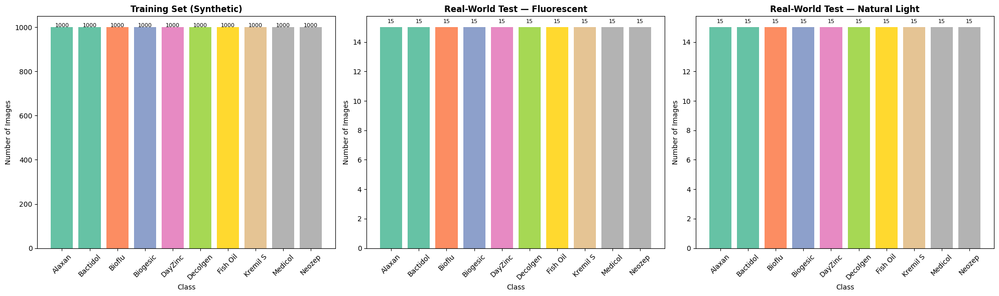

Class distribution charts saved.


In [15]:
# ── Class Distribution Visualisation ──────────────────────────────────
# Generates bar charts for training set and both real-world test subsets.
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes = axes.flatten()
colors = plt.cm.Set2(np.linspace(0, 1, 10))

datasets = [
    (train_counts,   'Training Set (Synthetic)',       axes[0]),
    (fluor_counts,   'Real-World Test — Fluorescent',  axes[1]),
    (natural_counts, 'Real-World Test — Natural Light', axes[2]),
]

for counts, title, ax in datasets:
    ax.bar(counts.keys(), counts.values(), color=colors)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Images')
    ax.tick_params(axis='x', rotation=45)
    for i, (k, v) in enumerate(counts.items()):
        ax.text(i, v + 0.3, str(v), ha='center', fontsize=8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'class_distribution.png', dpi=150)
plt.show()
print('Class distribution charts saved.')


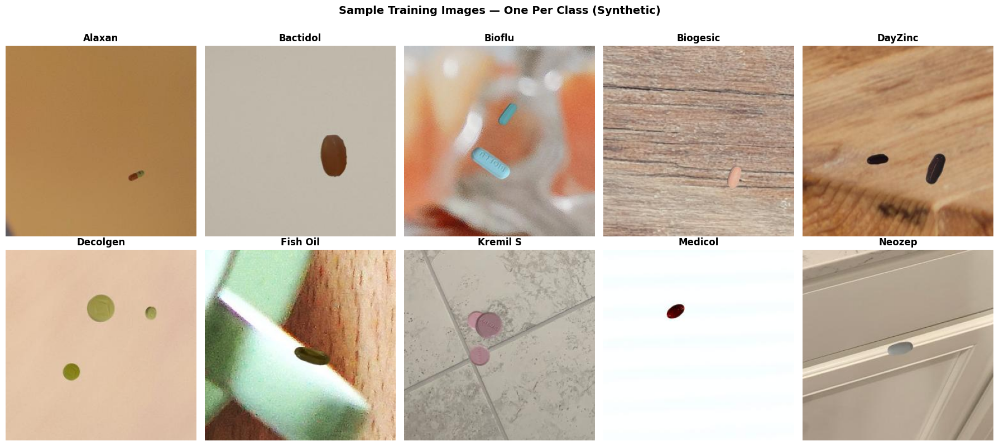

 Sample training images saved.


In [16]:
# ── Representative Sample Images (Synthetic Training Set) ─────────────
# Displays one randomly selected image per class from the training set
# for visual inspection of image quality and class appearance.
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()

for idx, cls in enumerate(CLASS_NAMES):
    cls_path = TRAIN_DIR / cls
    img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
    if img_files:
        img = Image.open(random.choice(img_files)).convert('RGB')
        axes[idx].imshow(img)
        axes[idx].set_title(cls, fontsize=12, fontweight='bold')
        axes[idx].axis('off')

plt.suptitle('Sample Training Images — One Per Class (Synthetic)', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'sample_train_images.png', dpi=150, bbox_inches='tight')
plt.show()
print(' Sample training images saved.')

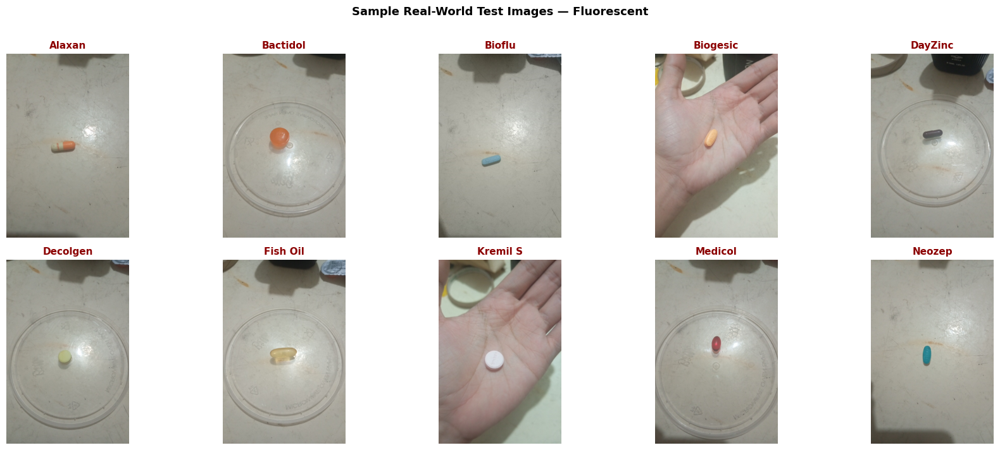

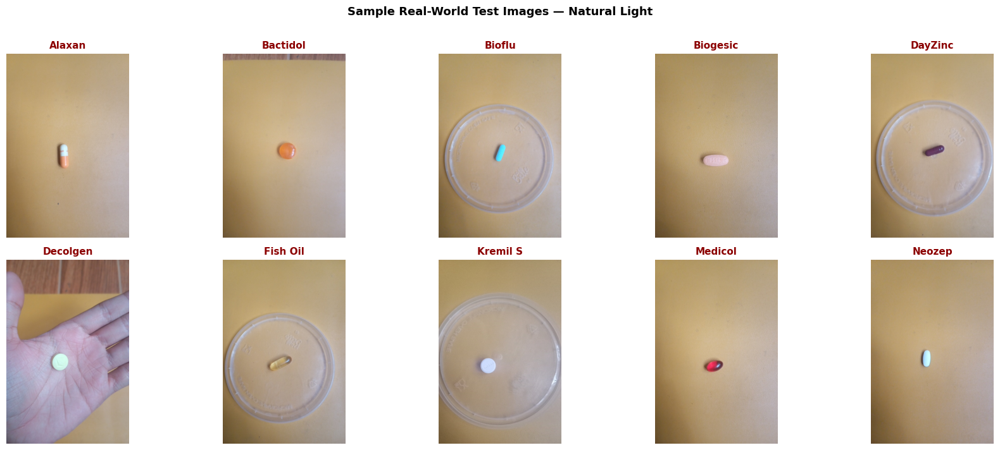

Sample test images saved for both lighting conditions.


In [17]:
# ── Representative Sample Images (Real-World Test Sets) ───────────────
# Displays one randomly selected image per class from each test subset.
for test_label, test_root in [('Fluorescent',   FLUOR_TEST_DIR),
                               ('Natural Light', NATURAL_TEST_DIR)]:
    fig, axes = plt.subplots(2, 5, figsize=(18, 7))
    axes = axes.flatten()
    for idx, cls in enumerate(CLASS_NAMES):
        cls_path = test_root / cls
        if cls_path.exists():
            img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
            if img_files:
                img = Image.open(random.choice(img_files)).convert('RGB')
                axes[idx].imshow(img)
                axes[idx].set_title(cls, fontsize=11, fontweight='bold', color='darkred')
                axes[idx].axis('off')
    plt.suptitle(f'Sample Real-World Test Images — {test_label}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    fname = test_label.lower().replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(OUTPUT_DIR / f'sample_test_{fname}.png', dpi=150, bbox_inches='tight')
    plt.show()
print('Sample test images saved for both lighting conditions.')


In [18]:
# ── Per-Channel Pixel Statistics ───────────────────────────────────────
# Computes mean and standard deviation of pixel intensities per RGB
# channel across a 500-image sample. Values confirm that ImageNet
# normalisation constants (mean=[0.485,0.456,0.406],
# std=[0.229,0.224,0.225]) are appropriate for this dataset.
all_imgs = []
for cls in CLASS_NAMES:
    cls_path = TRAIN_DIR / cls
    files = list(cls_path.glob('*.jpg'))[:50]
    all_imgs.extend(files)

pixel_values = []
for f in all_imgs[:500]:
    img = np.array(Image.open(f).convert('RGB').resize((256, 256))) / 255.0
    pixel_values.append(img)

pixel_array = np.array(pixel_values)  # shape: (N, H, W, 3)
mean = pixel_array.mean(axis=(0, 1, 2))
std  = pixel_array.std(axis=(0, 1, 2))

print(f'Dataset Mean (RGB) : {mean.round(4)}')
print(f'Dataset Std  (RGB) : {std.round(4)}')
print('(These empirical values validate the use of standard ImageNet normalisation constants.)')

Dataset Mean (RGB) : [0.596  0.554  0.5098]
Dataset Std  (RGB) : [0.261  0.2565 0.2723]
(These empirical values validate the use of standard ImageNet normalisation constants.)


In [19]:
# ── Mark EDA complete ──────────────────────────────────────────────────
if not _SKIP_EDA:
    mark_section_complete("eda")


  Section 'eda' marked complete.


---
## Section 3. Data Preprocessing and Augmentation

Two pipelines are defined. The training pipeline applies stochastic augmentation that
models the variability of real-world capture — cast shadows, exposure and gamma shifts,
mild colour-temperature drift, sensor noise, and lens flare — so the model generalises
from clean synthetic images to phone photographs. The evaluation pipeline is deterministic
preprocessing only.

**Boundary.** Augmentation is applied to the 70% training split only. The validation set,
the synthetic test set, and the real-world test images receive preprocessing only (resize,
a fixed contrast adjustment that mirrors the mobile app, normalisation, and tensor
conversion).

A preview cell renders ten random variations of a single training image so the diversity of the augmentation can be inspected visually while confirming that each drug's identifying features (packaging colour, text, and shape) remain recognisable.


In [20]:
# ── Data Preprocessing and Augmentation Pipelines ─────────────────────────
# TRAIN_AUGMENT      : applied on-the-fly to training batches only.
# VAL_TEST_TRANSFORM : deterministic preprocessing for validation and all test sets.

def apply_app_contrast(image, **kwargs):
    """Deterministic contrast boost (x1.2) mirroring the Flutter app preprocessing,
    applied to every split so training and on-device inference see the same input."""
    return np.array(ImageEnhance.Contrast(Image.fromarray(image)).enhance(1.2))


def apply_color_temperature(image, **kwargs):
    """Shift white balance to a sampled daylight colour temperature (~3000-7000 K)
    using a blackbody approximation. Gains are normalised on the green channel so
    overall brightness is preserved, modelling natural-light colour drift while
    keeping relative colour (the discriminative cue for similarly-boxed drugs)."""
    t = random.uniform(3000.0, 7000.0) / 100.0
    r = 255.0 if t <= 66 else 329.698727446 * ((t - 60) ** -0.1332047592)
    g = (99.4708025861 * np.log(t) - 161.1195681661) if t <= 66 \
        else 288.1221695283 * ((t - 60) ** -0.0755148492)
    b = 255.0 if t >= 66 else (0.0 if t <= 19 else 138.5177312231 * np.log(t - 10) - 305.0447927307)
    gains = np.clip(np.array([r, g, b], dtype=np.float32), 0, 255) / 255.0
    gains = gains / (gains[1] + 1e-6)
    out = image.astype(np.float32) * gains[None, None, :]
    return np.clip(out, 0, 255).astype(np.uint8)


def add_specular_highlights(image, **kwargs):
    """Overlay 1-3 soft white radial blobs near the centre to mimic the glossy-foil
    glare that bright/natural light produces on blister packaging."""
    out = image.astype(np.float32)
    h, w = out.shape[:2]
    yy, xx = np.mgrid[0:h, 0:w]
    for _ in range(random.randint(1, 3)):
        cy, cx = random.uniform(0.30, 0.70) * h, random.uniform(0.30, 0.70) * w
        radius = random.uniform(0.05, 0.18) * max(h, w)
        intensity = random.uniform(0.4, 0.9)
        mask = np.exp(-(((xx - cx) ** 2 + (yy - cy) ** 2) / (2.0 * radius ** 2))) * intensity
        out += (255.0 - out) * mask[..., None]
    return np.clip(out, 0, 255).astype(np.uint8)


TRAIN_AUGMENT = A.Compose([
    A.Resize(CFG['img_size'], CFG['img_size']),
    A.Lambda(image=apply_app_contrast, p=1.0),

    # Spatial augmentation (conservative, to preserve pill and packaging morphology).
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.4),

    # Cast-shadow simulation from windows / overhead lighting.
    A.RandomShadow(shadow_roi=(0, 0, 1, 1), num_shadows_lower=1,
                   num_shadows_upper=2, shadow_dimension=4, p=0.35),

    # Overexposure / highlight behaviour under bright light.
    A.RandomBrightnessContrast(brightness_limit=(0.00, 0.55),
                               contrast_limit=(-0.25, 0.05), p=0.45),
    A.RandomToneCurve(scale=0.25, p=0.30),

    # Colour-temperature jitter (daylight white-balance drift).
    A.Lambda(image=apply_color_temperature, p=0.40),

    # Gamma perturbation for invariance to overall exposure level.
    A.RandomGamma(gamma_limit=(70, 130), p=0.40),

    # Small hue/saturation/value drift (kept small to protect packaging colour).
    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=25, val_shift_limit=25, p=0.40),

    # Specular-highlight overlay (glossy-foil glare).
    A.Lambda(image=add_specular_highlights, p=0.30),

    # Colour-preserving contrast enhancement (CLAHE recovers text/logo detail
    # without the colour distortion of solarise/posterise/equalise).
    A.OneOf([
        A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1.0),
    ], p=0.25),

    # Colour and brightness jitter (hue kept low to protect colour-coded packaging).
    A.ColorJitter(brightness=0.40, contrast=0.40, saturation=0.30, hue=0.08, p=0.60),
    A.ToGray(p=0.05),

    # Camera / optics effects: mild blur and occasional lens flare.
    A.GaussianBlur(blur_limit=(3, 5), p=0.20),
    A.RandomSunFlare(flare_roi=(0, 0, 1, 1), angle_lower=0, angle_upper=1,
                     num_flare_circles_lower=1, num_flare_circles_upper=2,
                     src_radius=100, p=0.20),

    # Occasional single-channel highlight clipping (used sparingly).
    A.ChannelDropout(channel_drop_range=(1, 1), fill_value=255, p=0.05),

    # Sensor noise from higher-ISO / lower-shutter outdoor captures.
    A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.10, 0.50), p=0.20),

    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# Evaluation pipeline — deterministic preprocessing only (no augmentation).
VAL_TEST_TRANSFORM = A.Compose([
    A.Resize(CFG['img_size'], CFG['img_size']),
    A.Lambda(image=apply_app_contrast, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

print('Augmentation pipelines defined (training augmentation is train-split only).')


Augmentation pipelines defined (training augmentation is train-split only).


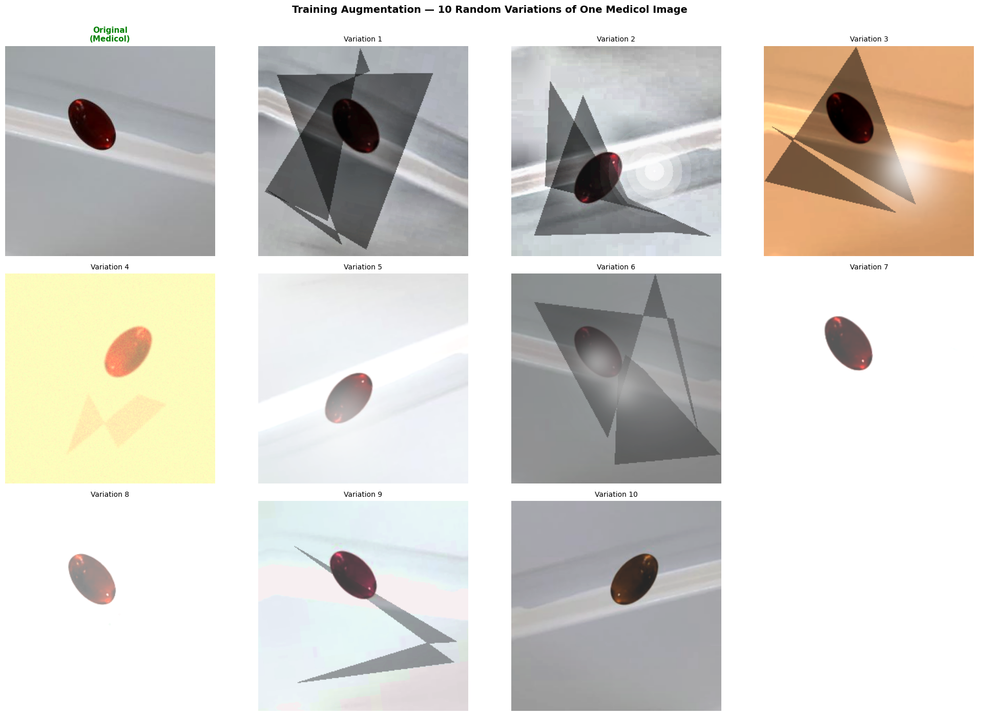

Augmentation preview saved: 10 variations of a Medicol sample.
Re-run this cell to preview a different image and new random variations.


In [21]:
# ── Augmentation Preview: 10 Random Variations of One Image ─────────────────
# Visual check that the training augmentation increases sample diversity while
# preserving the features needed to identify each drug. The preview mirrors the
# real TRAIN_AUGMENT pipeline exactly, dropping only the final Normalize and
# ToTensorV2 steps (which exist for the model, not for display) so pixels stay in
# the viewable [0, 255] range. A fresh image and 10 unique variations are drawn on
# every run, so re-running shows new samples.

# Build the display pipeline from TRAIN_AUGMENT, excluding Normalize / ToTensorV2.
_preview_transforms = [
    t for t in TRAIN_AUGMENT.transforms
    if not isinstance(t, (A.Normalize, ToTensorV2))
]
PREVIEW_AUG = A.Compose(_preview_transforms)

# Pick one random image from a random class (each run differs; sampling is
# intentionally unseeded here so the preview varies on re-run).
_preview_class = random.choice(CLASS_NAMES)
_preview_files = (list((TRAIN_DIR / _preview_class).glob('*.jpg')) +
                  list((TRAIN_DIR / _preview_class).glob('*.png')))
_preview_path = random.choice(_preview_files)
_original = np.array(Image.open(_preview_path).convert('RGB'))

# Generate 10 unique augmented variations of that single image.
N_VARIATIONS = 10
_variations = [PREVIEW_AUG(image=_original)['image'] for _ in range(N_VARIATIONS)]

# Lay out the original plus the 10 variations on a labelled grid (3 rows x 4 cols).
fig, axes = plt.subplots(3, 4, figsize=(20, 14))
axes = axes.flatten()

axes[0].imshow(_original)
axes[0].set_title(f'Original\n({_preview_class})', fontsize=11,
                  fontweight='bold', color='green')
axes[0].axis('off')

for idx, aug_img in enumerate(_variations, start=1):
    axes[idx].imshow(aug_img)
    axes[idx].set_title(f'Variation {idx}', fontsize=10)
    axes[idx].axis('off')

# The 12th panel is unused (1 original + 10 variations = 11 of 12 cells).
axes[11].axis('off')

plt.suptitle(f'Training Augmentation — 10 Random Variations of One {_preview_class} Image',
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'augmentation_preview.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'Augmentation preview saved: 10 variations of a {_preview_class} sample.')
print('Re-run this cell to preview a different image and new random variations.')


---
## Section 4. Dataset Construction and Strict 70/15/15 Split

The synthetic dataset is split **strictly 70/15/15** (train/val/synthetic-test) with stratification, on the raw file list before augmentation. Assertions verify the proportions, the absence of leakage, and that augmentation is train-only.

In [22]:
# ── PillDataset: Custom PyTorch Dataset ────────────────────────────────
# Implements torch.utils.data.Dataset for the pill image directory.
# Expected directory structure:
#   root/
#     ClassName_A/image001.jpg
#     ClassName_B/image001.jpg
#     ...
# Label indices are derived from the sorted class name list to ensure
# a consistent, reproducible index-to-label mapping.
class PillDataset(Dataset):
    """
    Custom Dataset that loads pill images from folder structure:
    root/ClassName/image.jpg
    Applies Albumentations transforms.
    """
    def __init__(self, root_dir, class_names, transform=None):
        self.root_dir    = Path(root_dir)
        self.class_names = sorted(class_names)
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.class_names)}
        self.transform   = transform
        self.samples     = self._load_samples()

    def _load_samples(self):
        samples = []
        for cls in self.class_names:
            cls_path = self.root_dir / cls
            if not cls_path.exists():
                print(f'  Missing folder: {cls_path}')
                continue
            for ext in ['*.jpg', '*.jpeg', '*.png']:
                for img_path in cls_path.glob(ext):
                    samples.append((str(img_path), self.class_to_idx[cls]))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image=image)['image']
        return image, label

print(' PillDataset class defined.')

 PillDataset class defined.


In [23]:
# ── Dataset Construction and Strict 70/15/15 Stratified Split ──────────────
# All splits are computed on the raw file list BEFORE augmentation, so the
# train-only augmentation boundary is structurally guaranteed.

full_dataset = PillDataset(TRAIN_DIR, CLASS_NAMES, transform=None)
all_paths  = [s[0] for s in full_dataset.samples]
all_labels = [s[1] for s in full_dataset.samples]

# Step 1: reserve 15% as the held-out synthetic test set.
train_val_paths, synth_test_paths, train_val_labels, synth_test_labels = train_test_split(
    all_paths, all_labels, test_size=CFG['synth_test_split'],
    stratify=all_labels, random_state=SEED
)
# Step 2: split the 85% remainder into 70% train / 15% val of the full dataset.
val_ratio = CFG['val_split'] / (1.0 - CFG['synth_test_split'])   # 0.15/0.85
train_paths, val_paths, train_labels, val_labels = train_test_split(
    train_val_paths, train_val_labels, test_size=val_ratio,
    stratify=train_val_labels, random_state=SEED
)


class SplitDataset(Dataset):
    """Dataset built from an explicit list of (path, label) pairs."""
    def __init__(self, paths, labels, transform=None):
        self.samples = list(zip(paths, labels))
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image=image)['image']
        return image, label


# Augmentation boundary: ONLY the training set receives TRAIN_AUGMENT.
train_dataset      = SplitDataset(train_paths,      train_labels,      TRAIN_AUGMENT)
val_dataset        = SplitDataset(val_paths,        val_labels,        VAL_TEST_TRANSFORM)
synth_test_dataset = SplitDataset(synth_test_paths, synth_test_labels, VAL_TEST_TRANSFORM)

train_loader = DataLoader(train_dataset, batch_size=CFG['batch_size'], shuffle=True,
                          num_workers=CFG['num_workers'], pin_memory=True,
                          worker_init_fn=seed_worker, generator=loader_generator)
val_loader = DataLoader(val_dataset, batch_size=CFG['batch_size'], shuffle=False,
                        num_workers=CFG['num_workers'], pin_memory=True,
                        worker_init_fn=seed_worker)
synth_test_loader = DataLoader(synth_test_dataset, batch_size=1, shuffle=False,
                               num_workers=CFG['num_workers'], worker_init_fn=seed_worker)

# ── Strict split + augmentation-boundary assertions ───────────────────────
total = len(all_paths)
assert total == len(train_paths) + len(val_paths) + len(synth_test_paths)
# No leakage between partitions.
assert set(train_paths).isdisjoint(val_paths)
assert set(train_paths).isdisjoint(synth_test_paths)
assert set(val_paths).isdisjoint(synth_test_paths)
# Proportions within 1% of the strict 70/15/15 target.
for name, part, target in [('train', train_paths, CFG['train_split']),
                           ('val', val_paths, CFG['val_split']),
                           ('synth_test', synth_test_paths, CFG['synth_test_split'])]:
    assert abs(len(part) / total - target) < 0.01, f'{name} ratio off target'
# Augmentation boundary: only the training set carries TRAIN_AUGMENT.
assert train_dataset.transform is TRAIN_AUGMENT
assert val_dataset.transform is VAL_TEST_TRANSFORM
assert synth_test_dataset.transform is VAL_TEST_TRANSFORM


def split_balance(labels, name):
    c = Counter(labels)
    ratios = {CLASS_NAMES[k]: f'{v/len(labels)*100:.1f}%' for k, v in sorted(c.items())}
    print(f'   {name}: {len(labels)} samples | {ratios}')

print('Strict 70/15/15 stratified split verified (no leakage; augmentation train-only).')
split_balance(train_labels,      'Train       ')
split_balance(val_labels,        'Val         ')
split_balance(synth_test_labels, 'Synth Test  ')
print(f'   Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')


Strict 70/15/15 stratified split verified (no leakage; augmentation train-only).
   Train       : 7000 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Val         : 1500 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Synth Test  : 1500 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Train batches: 219 | Val batches: 47


---
## Section 5. Model Definition — MobileNetV2

MobileNetV2 (Sandler et al., 2018) is a lightweight convolutional architecture built on
inverted-residual blocks with linear bottlenecks and depthwise-separable convolutions. It
relies purely on local convolutional feature extraction, giving strong accuracy at a low
parameter count suitable for on-device deployment.

**Reference:** Sandler, M., Howard, A., Zhu, M., Zhmoginov, A., & Chen, L.-C. (2018).
MobileNetV2: Inverted residuals and linear bottlenecks. *CVPR*, 4510–4520.


In [24]:
# ── MobileNetV2 Model Construction (Freeze + Unfreeze Progressive Fine-Tuning) ──
# Phase 1 freezes the pretrained backbone and trains only the classification
# head. This prevents catastrophic forgetting — the ImageNet-learned features
# remain intact while the head adapts to the pharmaceutical domain.
#
# Phase 2 unfreezes the full backbone and continues training with a very small
# learning rate (1e-5), making micro-adjustments to the pretrained weights
# without destroying the representations learned in Phase 1.
#
# Reference: Sandler et al. (2018). MobileNetV2: Inverted residuals
#            and linear bottlenecks. CVPR 2018.

def build_mobilenetv2(num_classes=10, pretrained=True, freeze_backbone=True):
    """
    Loads MobileNetV2 with ImageNet-pretrained weights via timm.

    MobileNetV2 is a purely convolutional model. Its 'backbone' consists
    of all layers except the final classification head (the classifier).

    Args:
        num_classes    : Number of target classes (10 for MediSina Scan).
        pretrained     : Whether to load ImageNet pretrained weights.
        freeze_backbone: If True, freezes all backbone layers (Phase 1).
                         If False, all layers are trainable (Phase 2).

    Returns:
        model: Configured MobileNetV2 model.
    """
    model = timm.create_model(
        CFG['model_name'],
        pretrained=pretrained,
        num_classes=num_classes
    )

    if freeze_backbone:
        # ── Phase 1: Freeze all backbone parameters ───────────────────────
        # Only the final classification head will receive gradient updates.
        # For MobileNetV2, all parameters outside the 'head' module are frozen.
        for param in model.parameters():
            param.requires_grad = False

        # Unfreeze only the classifier head via timm's standard API
        for param in model.get_classifier().parameters():
            param.requires_grad = True

    else:
        # ── Phase 2: Unfreeze entire model ────────────────────────────────
        # All parameters (convolutional blocks) receive gradient
        # updates. The very small LR (1e-5) ensures micro-adjustments only.
        for param in model.parameters():
            param.requires_grad = True

    # Log trainable vs frozen parameter counts
    total     = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen    = total - trainable
    print(f'Total parameters     : {total:,}')
    print(f'Trainable parameters : {trainable:,}')
    print(f'Frozen parameters    : {frozen:,}')

    return model



In [25]:
# ── Architecture Summary (parameter / layer table for documentation) ──────
# Documents the deployed architecture and total parameter count (thesis Tables 5/11).
_summary_model = build_mobilenetv2(num_classes=CFG['num_classes'],
                                     pretrained=True, freeze_backbone=False)
summary(_summary_model, input_size=(1, 3, CFG['img_size'], CFG['img_size']),
        col_names=('input_size', 'output_size', 'num_params', 'trainable'), depth=2)
del _summary_model


model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

Total parameters     : 2,236,682
Trainable parameters : 2,236,682
Frozen parameters    : 0


---
## Section 6. Model Training

Two-phase progressive fine-tuning strategy:
- **Phase 1 (Warm-Up):** Backbone frozen. Only the classification head is trained for up to 15 epochs. Prevents catastrophic forgetting during initial domain adaptation.
- **Phase 2 (Full Fine-Tuning):** Entire model unfrozen. Training continues with a very small learning rate (1e-5) so pretrained features receive only micro-adjustments.


In [26]:
# ── Training Helpers: Loss, Train, and Validate ────────────────────────────
# Defined once and reused across both training phases. The freeze state of the
# model parameters (set during model construction) determines what actually updates.

def make_class_weights(device):
    """Class-weighted loss emphasising the two visually hardest classes."""
    w = torch.ones(CFG['num_classes'])
    w[CLASS_NAMES.index('Decolgen')] = 2.2
    w[CLASS_NAMES.index('Alaxan')]   = 1.6
    return w.to(device)


def make_criterion(device):
    """Label-smoothed, class-weighted cross-entropy."""
    return nn.CrossEntropyLoss(label_smoothing=CFG['label_smooth'],
                               weight=make_class_weights(device))


def _rand_bbox(h, w, lam):
    """Random box for CutMix sized to remove a (1-lam) fraction of the image area."""
    cut = np.sqrt(1.0 - lam)
    cw, ch = int(w * cut), int(h * cut)
    cx, cy = np.random.randint(w), np.random.randint(h)
    x1, y1 = int(np.clip(cx - cw // 2, 0, w)), int(np.clip(cy - ch // 2, 0, h))
    x2, y2 = int(np.clip(cx + cw // 2, 0, w)), int(np.clip(cy + ch // 2, 0, h))
    return x1, y1, x2, y2


def mixup_cutmix(images, labels, alpha=0.2, cutmix_share=0.5):
    """Return mixed images, the two label sets, and lam for the linear MixUp/CutMix
    loss. Applied to TRAINING batches only. lam mixes the two cross-entropy terms,
    leaving the class-weighted, label-smoothed criterion unchanged."""
    lam = float(np.random.beta(alpha, alpha))
    idx = torch.randperm(images.size(0), device=images.device)
    y_a, y_b = labels, labels[idx]
    if random.random() < cutmix_share:
        h, w = images.size(2), images.size(3)
        x1, y1, x2, y2 = _rand_bbox(h, w, lam)
        images[:, :, y1:y2, x1:x2] = images[idx, :, y1:y2, x1:x2]
        lam = 1.0 - ((x2 - x1) * (y2 - y1) / (h * w))   # area-corrected
    else:
        images = lam * images + (1.0 - lam) * images[idx]
    return images, y_a, y_b, lam


def train_one_epoch(model, loader, criterion, optimizer, device,
                    use_mixup=False, mixup_alpha=0.2, mixup_p=0.5):
    """One full forward + backward pass over the training set (optional MixUp/CutMix)."""
    model.train()
    total_loss, correct, total = 0.0, 0.0, 0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        if use_mixup and random.random() < mixup_p:
            images, y_a, y_b, lam = mixup_cutmix(images, labels, mixup_alpha)
            outputs = model(images)
            loss = lam * criterion(outputs, y_a) + (1.0 - lam) * criterion(outputs, y_b)
            preds = outputs.argmax(dim=1)
            # Training accuracy is approximate under mixing (validation stays exact).
            correct += lam * preds.eq(y_a).sum().item() + (1.0 - lam) * preds.eq(y_b).sum().item()
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
            correct += outputs.argmax(dim=1).eq(labels).sum().item()
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * images.size(0)
        total += images.size(0)
    return total_loss / total, correct / total


def validate(model, loader, criterion, device):
    """Evaluation pass — no gradient computation."""
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            total_loss += criterion(outputs, labels).item() * images.size(0)
            correct += outputs.argmax(dim=1).eq(labels).sum().item()
            total += images.size(0)
    return total_loss / total, correct / total

print('Training helpers defined (make_criterion, train_one_epoch, validate).')


Training helpers defined (make_criterion, train_one_epoch, validate).


In [27]:
# ── PHASE 1: Warm-Up Training (Frozen Backbone) ────────────────────────────
# Trains only the classification head for PHASE1_EPOCHS epochs.
# The backbone is fully frozen — only the final linear layer receives
# gradient updates. Best weights are saved to PHASE1_CKPT.
#
# Rationale: Directly fine-tuning all layers from epoch 1 on a small
# pharmaceutical dataset risks corrupting pretrained ImageNet features
# (catastrophic forgetting). Warming up the head first establishes a
# stable gradient signal before the backbone is unlocked.

PHASE1_EPOCHS = 15           # Warm-up duration for the classification head
PHASE1_LR     = 1e-3         # Higher LR is acceptable while the backbone is frozen
PHASE1_CKPT   = str(OUTPUT_DIR / 'phase1_best_mobilenetv2.pth')

# ── Session guard: skip Phase 1 if checkpoint already exists ──────────────
if is_section_done('phase1_training') and Path(PHASE1_CKPT).exists():
    print('Phase 1 checkpoint found from a previous session. Skipping Phase 1.')
    phase1_log = []   # empty -- curves will only show Phase 2 epochs
else:
    # Initialise model with frozen backbone
    model = build_mobilenetv2(
        num_classes=CFG['num_classes'],
        pretrained=True,
        freeze_backbone=True
    ).to(CFG['device'])

    criterion = make_criterion(CFG['device'])

    # Optimizer: only parameters with requires_grad=True are passed.
    # This automatically excludes all frozen backbone parameters.
    optimizer = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=PHASE1_LR,
        weight_decay=CFG['weight_decay']
    )

    # Cosine annealing over Phase 1 duration
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=PHASE1_EPOCHS
    )

    print('=' * 70)
    print('PHASE 1 -- Warm-Up: Training classification head (backbone frozen)')
    print('=' * 70)

    best_val_acc = 0.0
    phase1_log   = []

    for epoch in range(1, PHASE1_EPOCHS + 1):
        t0 = time.time()

        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, CFG['device'],
            use_mixup=CFG['mixup']['use'], mixup_alpha=CFG['mixup']['alpha'],
            mixup_p=CFG['mixup']['p']
        )
        val_loss, val_acc = validate(
            model, val_loader, criterion, CFG['device']
        )
        scheduler.step()

        elapsed = time.time() - t0
        is_best = val_acc > best_val_acc
        tag     = 'BEST' if is_best else ''

        if is_best:
            best_val_acc = val_acc
            torch.save({
                'epoch'       : epoch,
                'model_state' : model.state_dict(),
                'val_acc'     : best_val_acc,
                'phase'       : 1
            }, PHASE1_CKPT)

        phase1_log.append({
            'epoch'     : epoch,
            'train_loss': train_loss,
            'train_acc' : train_acc,
            'val_loss'  : val_loss,
            'val_acc'   : val_acc,
            'time'      : elapsed,
        })

        print(
            f'Epoch [{epoch:02d}/{PHASE1_EPOCHS}] | '
            f'Train Loss: {train_loss:.4f}  Acc: {train_acc:.4f} | '
            f'Val Loss: {val_loss:.4f}  Acc: {val_acc:.4f} | '
            f'LR: {scheduler.get_last_lr()[0]:.2e} | '
            f'Time: {elapsed:.1f}s  {tag}'
        )

    print('=' * 70)
    print(f'Phase 1 complete. Best Validation Accuracy: {best_val_acc:.4f}')
    print(f'Best weights saved to: {PHASE1_CKPT}')
    mark_section_complete('phase1_training', {'phase1_best_val_acc': float(best_val_acc)})


Total parameters     : 2,236,682
Trainable parameters : 12,810
Frozen parameters    : 2,223,872
PHASE 1 -- Warm-Up: Training classification head (backbone frozen)
Epoch [01/15] | Train Loss: 3.0691  Acc: 0.1393 | Val Loss: 2.3564  Acc: 0.2827 | LR: 9.89e-04 | Time: 81.6s  BEST
Epoch [02/15] | Train Loss: 2.4757  Acc: 0.2394 | Val Loss: 1.9233  Acc: 0.4227 | LR: 9.57e-04 | Time: 52.5s  BEST
Epoch [03/15] | Train Loss: 2.2557  Acc: 0.2978 | Val Loss: 1.6994  Acc: 0.5047 | LR: 9.05e-04 | Time: 53.2s  BEST
Epoch [04/15] | Train Loss: 2.1451  Acc: 0.3310 | Val Loss: 1.5682  Acc: 0.5320 | LR: 8.35e-04 | Time: 54.6s  BEST
Epoch [05/15] | Train Loss: 2.0324  Acc: 0.3671 | Val Loss: 1.4917  Acc: 0.5707 | LR: 7.50e-04 | Time: 53.3s  BEST
Epoch [06/15] | Train Loss: 2.0387  Acc: 0.3695 | Val Loss: 1.4505  Acc: 0.5933 | LR: 6.55e-04 | Time: 55.3s  BEST
Epoch [07/15] | Train Loss: 1.9791  Acc: 0.3843 | Val Loss: 1.4129  Acc: 0.6087 | LR: 5.52e-04 | Time: 52.9s  BEST
Epoch [08/15] | Train Loss: 1.96

In [28]:
# ── PHASE 2: Full Fine-Tuning (Unfrozen Backbone) ──────────────────────────
# The full backbone is unfrozen and fine-tuned at a low learning rate, starting from
# the Phase 1 head weights. A cosine schedule with warm restarts (T_0=10, T_mult=2,
# eta_min=1e-7) periodically raises the learning rate to help the optimiser escape
# flat minima; early stopping uses CFG['patience'] so training is not cut short during
# the low-learning-rate portion of a cosine cycle.

PHASE2_EPOCHS   = CFG['epochs']
PHASE2_LR       = 1e-5
PHASE2_PATIENCE = CFG['patience']
PHASE2_CKPT     = str(OUTPUT_DIR / 'best_mobilenetv2.pth')

# ── Step 1: Load Phase 1 best weights into a fresh unfrozen model ──────────
model = build_mobilenetv2(
    num_classes=CFG['num_classes'],
    pretrained=False,
    freeze_backbone=False
).to(CFG['device'])

phase1_checkpoint = torch.load(PHASE1_CKPT, map_location=CFG['device'])
model.load_state_dict(phase1_checkpoint['model_state'])

print(f'Phase 1 weights loaded (saved at epoch {phase1_checkpoint["epoch"]}).')
print(f'Phase 1 best val accuracy: {phase1_checkpoint["val_acc"]:.4f}')

criterion = make_criterion(CFG['device'])

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=PHASE2_LR,
    weight_decay=CFG['weight_decay']
)

# CosineAnnealingWarmRestarts: T_0=10 epochs per first cycle, doubling each restart.
# Warm restarts periodically raise LR from eta_min back to PHASE2_LR, allowing
# the model to escape shallow local minima encountered under distribution shift.
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=10,        # restart after 10 epochs
    T_mult=2,      # each subsequent cycle is 2× longer
    eta_min=1e-7   # floor LR between restarts
)

# ── Step 3: Phase 2 Training Loop with Early Stopping ─────────────────────
print()
print('=' * 70)
print('PHASE 2 -- Full Fine-Tuning (entire backbone unfrozen)')
print('         Scheduler: CosineAnnealingWarmRestarts (T_0=10, T_mult=2)')
print('=' * 70)

best_val_acc  = phase1_checkpoint['val_acc']
patience_ctr  = 0
phase2_log    = []

for epoch in range(1, PHASE2_EPOCHS + 1):
    t0 = time.time()


    train_loss, train_acc = train_one_epoch(
        model, train_loader, criterion, optimizer, CFG['device'],
        use_mixup=CFG['mixup']['use'], mixup_alpha=CFG['mixup']['alpha'],
        mixup_p=CFG['mixup']['p']
    )
    val_loss, val_acc = validate(
        model, val_loader, criterion, CFG['device']
    )

    scheduler.step(epoch - 1)   # CosineAnnealingWarmRestarts expects step(epoch)

    elapsed = time.time() - t0
    is_best = val_acc > best_val_acc
    tag     = '★ BEST' if is_best else ''

    if is_best:
        best_val_acc = val_acc
        patience_ctr = 0
        torch.save({
            'epoch'       : epoch,
            'model_state' : model.state_dict(),
            'optimizer'   : optimizer.state_dict(),
            'scheduler'   : scheduler.state_dict(),
            'val_acc'     : best_val_acc,
            'train_log'   : phase2_log,
            'phase'       : 2
        }, PHASE2_CKPT)
    else:
        patience_ctr += 1

    phase2_log.append({
        'epoch'     : epoch,
        'train_loss': train_loss,
        'train_acc' : train_acc,
        'val_loss'  : val_loss,
        'val_acc'   : val_acc,
        'time'      : elapsed,
    })

    print(
        f'Epoch [{epoch:02d}/{PHASE2_EPOCHS}] | '
        f'Train Loss: {train_loss:.4f}  Acc: {train_acc:.4f} | '
        f'Val Loss: {val_loss:.4f}  Acc: {val_acc:.4f} | '
        f'LR: {scheduler.get_last_lr()[0]:.2e} | '
        f'Time: {elapsed:.1f}s  {tag}'
    )

    if patience_ctr >= PHASE2_PATIENCE:
        print(
            f'\nEarly stopping triggered at epoch {epoch} '
            f'(no improvement for {PHASE2_PATIENCE} consecutive epochs).'
        )
        break


print('=' * 70)
print(f'Phase 2 complete. Best Validation Accuracy: {best_val_acc:.4f}')
print(f'Best weights saved to: {PHASE2_CKPT}')

mark_section_complete('training', {
    'phase1_best_val_acc' : phase1_checkpoint['val_acc'],
    'phase2_best_val_acc' : float(best_val_acc),
    'phase2_epochs_run'   : epoch,
})

Total parameters     : 2,236,682
Trainable parameters : 2,236,682
Frozen parameters    : 0
Phase 1 weights loaded (saved at epoch 11).
Phase 1 best val accuracy: 0.6547

PHASE 2 -- Full Fine-Tuning (entire backbone unfrozen)
         Scheduler: CosineAnnealingWarmRestarts (T_0=10, T_mult=2)
Epoch [01/100] | Train Loss: 1.8437  Acc: 0.4336 | Val Loss: 1.1916  Acc: 0.7133 | LR: 1.00e-05 | Time: 57.0s  ★ BEST
Epoch [02/100] | Train Loss: 1.7663  Acc: 0.4739 | Val Loss: 1.0763  Acc: 0.7640 | LR: 9.76e-06 | Time: 59.3s  ★ BEST
Epoch [03/100] | Train Loss: 1.6620  Acc: 0.5150 | Val Loss: 1.0234  Acc: 0.7860 | LR: 9.05e-06 | Time: 62.5s  ★ BEST
Epoch [04/100] | Train Loss: 1.5774  Acc: 0.5445 | Val Loss: 0.9712  Acc: 0.8140 | LR: 7.96e-06 | Time: 65.1s  ★ BEST
Epoch [05/100] | Train Loss: 1.5955  Acc: 0.5539 | Val Loss: 0.9403  Acc: 0.8260 | LR: 6.58e-06 | Time: 65.7s  ★ BEST
Epoch [06/100] | Train Loss: 1.5074  Acc: 0.5822 | Val Loss: 0.9173  Acc: 0.8367 | LR: 5.05e-06 | Time: 66.0s  ★ BEST


---
## Section 7. Training Curve Visualisation


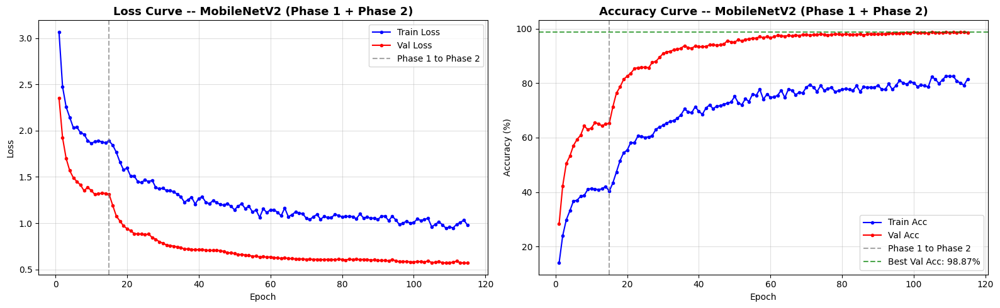

Training loss and accuracy curves saved to output directory.
Average epoch duration : 58.6 s
Total training time    : 112.3 minutes


In [29]:
# ── Training Curve Visualisation ───────────────────────────────────────
# Combines Phase 1 and Phase 2 logs into a single unified curve.
# A vertical dashed line marks the Phase 1 to Phase 2 boundary.
# Curves are saved as a PNG figure for inclusion in the thesis results section.

combined_log = phase1_log + phase2_log
epochs_ran   = list(range(1, len(combined_log) + 1))
phase1_end   = len(phase1_log)   # x-position of phase boundary

train_losses = [e['train_loss'] for e in combined_log]
val_losses   = [e['val_loss']   for e in combined_log]
train_accs   = [e['train_acc']  * 100 for e in combined_log]
val_accs     = [e['val_acc']    * 100 for e in combined_log]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Loss panel
axes[0].plot(epochs_ran, train_losses, 'b-o', label='Train Loss', markersize=3)
axes[0].plot(epochs_ran, val_losses,   'r-o', label='Val Loss',   markersize=3)
if phase1_end > 0:
    axes[0].axvline(x=phase1_end, color='gray', linestyle='--',
                    alpha=0.7, label='Phase 1 to Phase 2')
axes[0].set_title('Loss Curve -- MobileNetV2 (Phase 1 + Phase 2)',
                  fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.4)

# Accuracy panel
axes[1].plot(epochs_ran, train_accs, 'b-o', label='Train Acc', markersize=3)
axes[1].plot(epochs_ran, val_accs,   'r-o', label='Val Acc',   markersize=3)
if phase1_end > 0:
    axes[1].axvline(x=phase1_end, color='gray', linestyle='--',
                    alpha=0.7, label='Phase 1 to Phase 2')
axes[1].axhline(y=best_val_acc * 100, color='green', linestyle='--',
                alpha=0.7, label=f'Best Val Acc: {best_val_acc*100:.2f}%')
axes[1].set_title('Accuracy Curve -- MobileNetV2 (Phase 1 + Phase 2)',
                  fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'training_curves.png', dpi=150)
plt.show()
print('Training loss and accuracy curves saved to output directory.')

# Timing summary
all_times = [e['time'] for e in combined_log if 'time' in e]
if all_times:
    avg_time   = float(np.mean(all_times))
    total_time = float(sum(all_times))
    print(f'Average epoch duration : {avg_time:.1f} s')
    print(f'Total training time    : {total_time/60:.1f} minutes')


In [30]:
# ── Mark training curves section complete ───────────────────────────────
mark_section_complete("training_curves")


  Section 'training_curves' marked complete.


---
## Section 8. Evaluation — Helpers and Best Checkpoint

In [31]:
# ── Load Best Model Checkpoint for Evaluation ──────────────────────────
# Reloads the model weights from the best Phase 2 (full fine-tuning)
# checkpoint. freeze_backbone=False ensures the model is in its fully
# trainable state, consistent with how it was saved during Phase 2.
# model.eval() disables dropout and batch normalisation update behaviour.

model = build_mobilenetv2(
    num_classes=CFG['num_classes'],
    pretrained=False,        # Weights come entirely from the saved checkpoint
    freeze_backbone=False    # Evaluation model should reflect Phase 2 state
)
checkpoint = torch.load(CKPT_PATH, map_location=CFG['device'])
model.load_state_dict(checkpoint['model_state'])
model = model.to(CFG['device'])
model.eval()
print(f'Best model checkpoint loaded (saved at epoch {checkpoint["epoch"]}). ')
print(f'Checkpoint phase: {checkpoint.get("phase", "unknown")}')


Total parameters     : 2,236,682
Trainable parameters : 2,236,682
Frozen parameters    : 0
Best model checkpoint loaded (saved at epoch 90). 
Checkpoint phase: 2


In [32]:
# ── Single-Image Inference Function ────────────────────────────────────
# predict_single() accepts an image file path and returns the predicted
# class label, softmax confidence score, and per-image inference latency.
# Input preprocessing follows the VAL_TEST_TRANSFORM pipeline to match
# the conditions used during model evaluation.
def predict_single(image_path, model, transform, class_names, device):
    """
    Classifies a single image.
    Returns: (filename, predicted_class, confidence_percent, inference_ms)
    """
    image_path = Path(image_path)
    image = cv2.imread(str(image_path))
    if image is None:
        return str(image_path.name), 'ERROR: Cannot read image', 0.0, 0.0

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    tensor = transform(image=image)['image'].unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        t0      = time.time()
        outputs = model(tensor)
        t1      = time.time()

    probs      = torch.softmax(outputs, dim=1)[0]
    pred_idx   = probs.argmax().item()
    confidence = probs[pred_idx].item() * 100
    inf_ms     = (t1 - t0) * 1000

    return image_path.name, class_names[pred_idx], round(confidence, 2), round(inf_ms, 2)


print(' Inference helper defined.')

 Inference helper defined.


In [33]:
# ── Shared Evaluation Function (single-pass, deterministic; no TTA) ────────
# Reports accuracy, weighted precision/recall/F1, mean per-image latency, raw +
# normalised confusion matrices, a per-class report, and a sample-prediction grid.

def evaluate_dataset(test_dir, dataset_label, model, transform, class_names,
                     device, output_dir, save_prefix):
    """Evaluate the model on a labelled folder hierarchy (root/ClassName/img.jpg)."""
    test_dir, output_dir = Path(test_dir), Path(output_dir)
    all_preds, all_labels, all_probs, inference_times = [], [], [], []
    model.eval()

    for cls_name in sorted(class_names):
        cls_path = test_dir / cls_name
        if not cls_path.exists():
            continue
        label_idx = class_names.index(cls_name)
        for img_path in list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')):
            image = cv2.imread(str(img_path))
            if image is None:
                continue
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            t0 = time.time()
            tensor = transform(image=image)['image'].unsqueeze(0).to(device)
            with torch.no_grad():
                logits = model(tensor)
            probs = torch.softmax(logits, dim=1)[0].cpu().numpy()
            inference_times.append((time.time() - t0) * 1000)   # per-image latency (ms)
            all_probs.append(probs)
            all_preds.append(int(probs.argmax()))
            all_labels.append(label_idx)

    acc = accuracy_score(all_labels, all_preds)
    prec, rec, f1, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0)
    avg_ms = float(np.mean(inference_times)) if inference_times else 0.0

    print(f'\n{"="*60}')
    print(f'  {dataset_label}')
    print(f'{"="*60}')
    print(f'  Accuracy  : {acc*100:.2f}%')
    print(f'  Precision : {prec*100:.2f}%')
    print(f'  Recall    : {rec*100:.2f}%')
    print(f'  F1        : {f1*100:.2f}%')
    print(f'  Avg Inf.  : {avg_ms:.2f} ms/image')

    # Confusion matrices — raw counts and row-normalised (parity with synthetic set).
    cm = confusion_matrix(all_labels, all_preds)
    cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True).clip(min=1)
    fig, axcm = plt.subplots(1, 2, figsize=(20, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axcm[0])
    axcm[0].set_title(f'Confusion Matrix (Counts) — {dataset_label}', fontweight='bold')
    axcm[0].set_xlabel('Predicted'); axcm[0].set_ylabel('True')
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens', vmin=0, vmax=1,
                xticklabels=class_names, yticklabels=class_names, ax=axcm[1])
    axcm[1].set_title(f'Confusion Matrix (Normalised) — {dataset_label}', fontweight='bold')
    axcm[1].set_xlabel('Predicted'); axcm[1].set_ylabel('True')
    plt.tight_layout()
    plt.savefig(output_dir / f'{save_prefix}_confusion_matrix.png', dpi=150)
    plt.show()

    print(f'\nClassification Report — {dataset_label}')
    print(classification_report(all_labels, all_preds, target_names=class_names,
                                zero_division=0, digits=4))

    # Sample prediction grid (one random image per class).
    fig2, axes2 = plt.subplots(2, 5, figsize=(20, 9))
    axes2 = axes2.flatten()
    for cls_idx, cls_name in enumerate(class_names):
        cls_path = Path(test_dir) / cls_name
        files = (list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
                 if cls_path.exists() else [])
        if not files:
            axes2[cls_idx].axis('off'); continue
        img_path = random.choice(files)
        _, pred_class, confidence, _ = predict_single(img_path, model, transform, class_names, device)
        axes2[cls_idx].imshow(np.array(Image.open(img_path).convert('RGB')))
        axes2[cls_idx].set_title(f'True: {cls_name}\nPred: {pred_class} ({confidence:.1f}%)',
                                 fontsize=9, fontweight='bold',
                                 color='green' if pred_class == cls_name else 'red')
        axes2[cls_idx].axis('off')
    plt.suptitle(f'Sample Predictions — MobileNetV2 | {dataset_label}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(output_dir / f'{save_prefix}_sample_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

    return {'preds': all_preds, 'labels': all_labels, 'probs': all_probs,
            'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1, 'avg_inf_ms': avg_ms}

print('evaluate_dataset() defined (single-pass; raw + normalised confusion matrices).')


evaluate_dataset() defined (single-pass; raw + normalised confusion matrices).


In [34]:
# ── Synthetic Test Set — Sample Prediction Grid ────────────────────────────
# Same format as the real-world grids, but drawn from the in-memory synthetic
# test split (synth_test_paths / synth_test_labels) rather than a folder tree.

def show_synthetic_predictions(paths, labels, model, transform, class_names,
                               device, output_dir, model_label='MobileNetV2',
                               save_prefix='synthetic_test'):
    """Display one representative prediction per class from the synthetic test split."""
    output_dir = Path(output_dir)
    paths_by_class = {idx: [] for idx in range(len(class_names))}
    for path, label in zip(paths, labels):
        paths_by_class[label].append(path)

    fig, axes = plt.subplots(2, 5, figsize=(20, 9))
    axes = axes.flatten()
    for cls_idx, cls_name in enumerate(class_names):
        candidates = paths_by_class.get(cls_idx, [])
        if not candidates:
            axes[cls_idx].axis('off'); continue
        img_path = random.choice(candidates)
        _, pred_class, confidence, _ = predict_single(img_path, model, transform, class_names, device)
        axes[cls_idx].imshow(np.array(Image.open(img_path).convert('RGB')))
        axes[cls_idx].set_title(f'True: {cls_name}\nPred: {pred_class} ({confidence:.1f}%)',
                                fontsize=9, fontweight='bold',
                                color='green' if pred_class == cls_name else 'red')
        axes[cls_idx].axis('off')
    plt.suptitle(f'Sample Predictions — {model_label} | Synthetic Test Set',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(output_dir / f'{save_prefix}_sample_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

print('show_synthetic_predictions() defined.')


show_synthetic_predictions() defined.


---
## Section 9. Synthetic Test Set Results

Best model checkpoint loaded (saved at epoch 90). 
CLASSIFICATION REPORT  --  Synthetic Test Set (MobileNetV2)
              precision    recall  f1-score   support

      Alaxan     0.9677    1.0000    0.9836       150
    Bactidol     0.9933    0.9867    0.9900       150
      Bioflu     0.9677    1.0000    0.9836       150
    Biogesic     0.9799    0.9733    0.9766       150
     DayZinc     0.9867    0.9867    0.9867       150
    Decolgen     0.9740    1.0000    0.9868       150
    Fish Oil     0.9932    0.9800    0.9866       150
    Kremil S     0.9932    0.9667    0.9797       150
     Medicol     0.9868    0.9933    0.9900       150
      Neozep     1.0000    0.9533    0.9761       150

    accuracy                         0.9840      1500
   macro avg     0.9842    0.9840    0.9840      1500
weighted avg     0.9842    0.9840    0.9840      1500

Overall Accuracy  : 98.40%
Report saved to: /kaggle/working/medisina_output/synth_test_report_mobilenetv2.txt


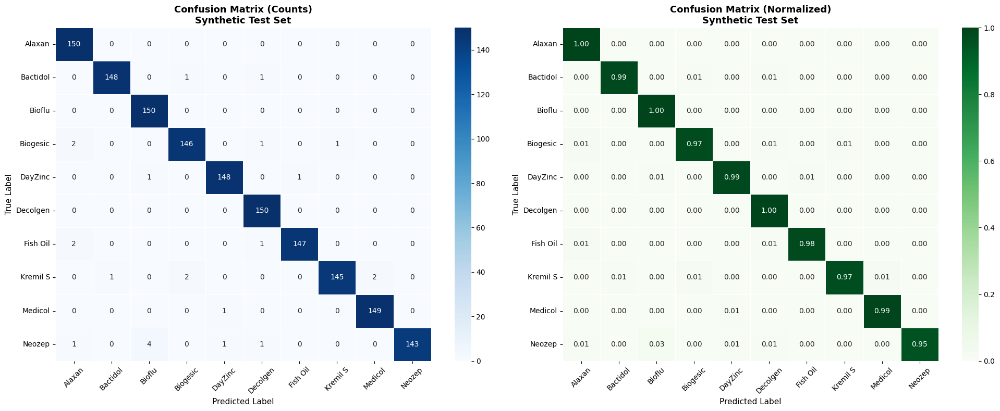

Confusion matrix saved to: /kaggle/working/medisina_output/synth_test_confusion_matrix_mobilenetv2.png


In [35]:
# ── Synthetic Test Set Evaluation ──────────────────────────────────────────
# Evaluates the held-out 15% synthetic test set using the best model
# checkpoint. This set was never seen during training or early stopping,
# making it a controlled in-distribution performance benchmark.

# Load best model checkpoint
ckpt_path = os.path.join(OUTPUT_DIR, 'best_mobilenetv2.pth')
checkpoint = torch.load(ckpt_path, map_location=CFG['device'])
model.load_state_dict(checkpoint['model_state'])
model.eval()
print(f'Best model checkpoint loaded (saved at epoch {checkpoint["epoch"]}). ')

# Run inference on synthetic test set
all_preds  = []
all_labels = []

with torch.no_grad():
    for images, labels in synth_test_loader:
        images = images.to(CFG['device'])
        outputs = model(images)
        preds   = outputs.argmax(dim=1).cpu().tolist()
        all_preds.extend(preds)
        all_labels.extend(labels.tolist())

synth_acc = accuracy_score(all_labels, all_preds)

# Persist synthetic-test results for the comprehensive summary (Section 13).
synth_preds, synth_labels = list(all_preds), list(all_labels)
results_synth = {'labels': synth_labels, 'preds': synth_preds, 'accuracy': synth_acc}

# Classification report
report = classification_report(
    all_labels, all_preds,
    target_names=CLASS_NAMES,
    digits=4
)

print('=' * 70)
print('CLASSIFICATION REPORT  --  Synthetic Test Set (MobileNetV2)')
print('=' * 70)
print(report)
print(f'Overall Accuracy  : {synth_acc*100:.2f}%')

# Save to file
report_path = os.path.join(OUTPUT_DIR, 'synth_test_report_mobilenetv2.txt')
with open(report_path, 'w') as f:
    f.write('CLASSIFICATION REPORT  --  Synthetic Test Set (MobileNetV2)\n')
    f.write('=' * 70 + '\n')
    f.write(report)
    f.write(f'\nOverall Accuracy: {synth_acc*100:.2f}%\n')

print(f'Report saved to: {report_path}')

# ── Confusion Matrix for Synthetic Test Set ─────────────────────────────
cm = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# 1. Confusion Matrix (Raw Counts)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_title('Confusion Matrix (Counts)\nSynthetic Test Set',
                  fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=11)
axes[0].set_ylabel('True Label', fontsize=11)
axes[0].tick_params(axis='x', rotation=45)
axes[0].tick_params(axis='y', rotation=0)

# 2. Confusion Matrix (Normalized)
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_title('Confusion Matrix (Normalized)\nSynthetic Test Set',
                  fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=11)
axes[1].set_ylabel('True Label', fontsize=11)
axes[1].tick_params(axis='x', rotation=45)
axes[1].tick_params(axis='y', rotation=0)

plt.tight_layout()

# Save the plot
cm_path = os.path.join(OUTPUT_DIR, 'synth_test_confusion_matrix_mobilenetv2.png')
plt.savefig(cm_path, dpi=150, bbox_inches='tight')
plt.show()

print(f'Confusion matrix saved to: {cm_path}')

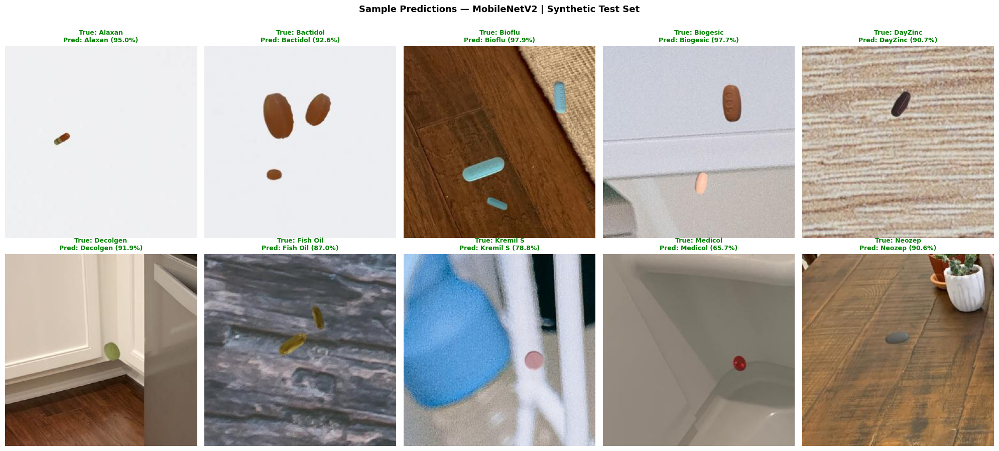

In [36]:
# Synthetic-test sample-prediction grid (one image per class).
show_synthetic_predictions(
    synth_test_paths, synth_test_labels, model, VAL_TEST_TRANSFORM,
    CLASS_NAMES, CFG['device'], OUTPUT_DIR, model_label='MobileNetV2'
)


---
## Section 10. Real-World Evaluation

Evaluation under two lighting conditions (fluorescent and natural), each with a per-class report and confusion matrices, followed by a cross-condition and domain-gap summary.

### Section 10a. Fluorescent Light


  Fluorescent Light
  Accuracy  : 91.33%
  Precision : 92.96%
  Recall    : 91.33%
  F1        : 91.05%
  Avg Inf.  : 9.53 ms/image


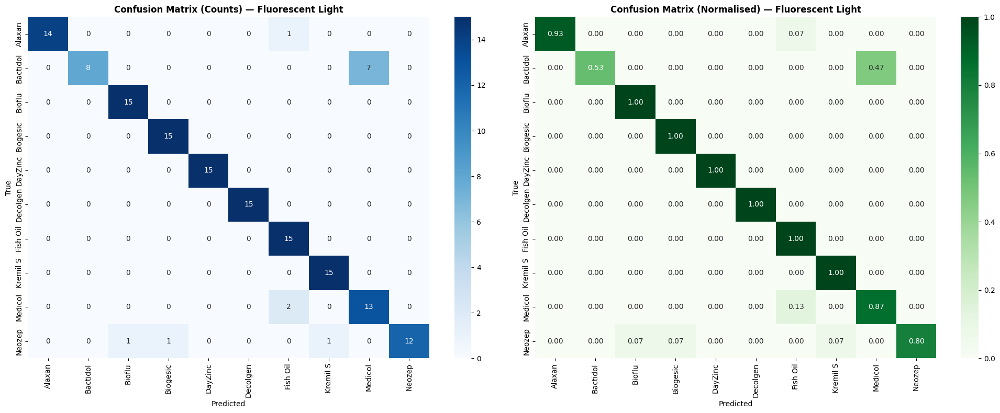


Classification Report — Fluorescent Light
              precision    recall  f1-score   support

      Alaxan     1.0000    0.9333    0.9655        15
    Bactidol     1.0000    0.5333    0.6957        15
      Bioflu     0.9375    1.0000    0.9677        15
    Biogesic     0.9375    1.0000    0.9677        15
     DayZinc     1.0000    1.0000    1.0000        15
    Decolgen     1.0000    1.0000    1.0000        15
    Fish Oil     0.8333    1.0000    0.9091        15
    Kremil S     0.9375    1.0000    0.9677        15
     Medicol     0.6500    0.8667    0.7429        15
      Neozep     1.0000    0.8000    0.8889        15

    accuracy                         0.9133       150
   macro avg     0.9296    0.9133    0.9105       150
weighted avg     0.9296    0.9133    0.9105       150



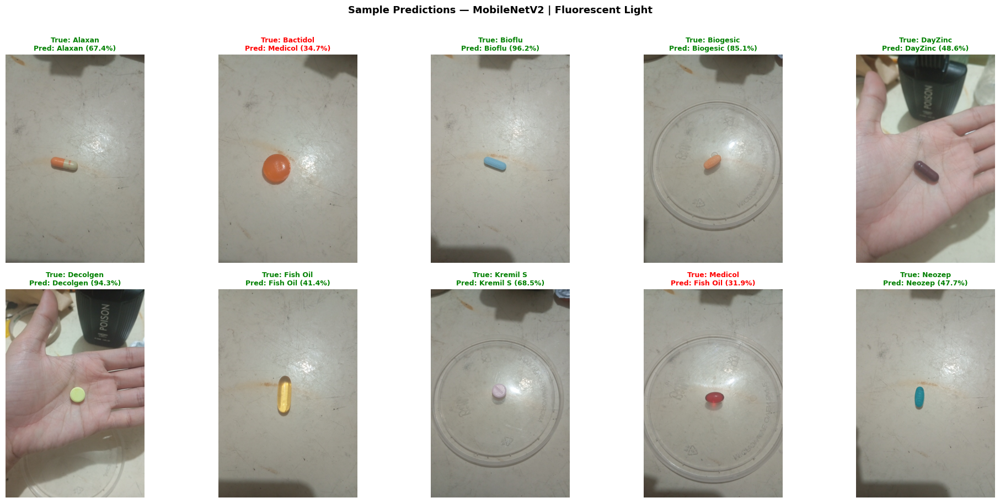

In [37]:
# ── Fluorescent Light Evaluation ──────────────────────────────
results_fluor = evaluate_dataset(
    test_dir      = FLUOR_TEST_DIR,
    dataset_label = 'Fluorescent Light',
    model         = model,
    transform     = VAL_TEST_TRANSFORM,
    class_names   = CLASS_NAMES,
    device        = CFG['device'],
    output_dir    = OUTPUT_DIR,
    save_prefix   = 'fluorescent_light'
)


### Section 10b. Natural Light


  Natural Light
  Accuracy  : 64.00%
  Precision : 73.25%
  Recall    : 64.00%
  F1        : 62.70%
  Avg Inf.  : 9.52 ms/image


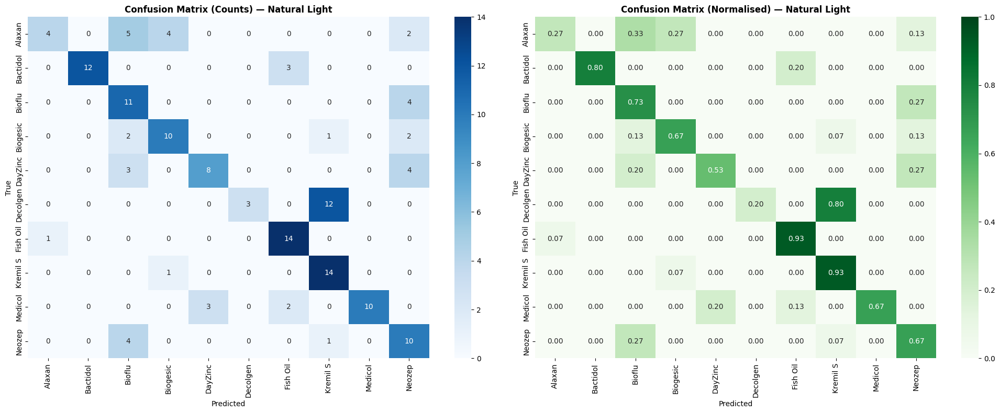


Classification Report — Natural Light
              precision    recall  f1-score   support

      Alaxan     0.8000    0.2667    0.4000        15
    Bactidol     1.0000    0.8000    0.8889        15
      Bioflu     0.4400    0.7333    0.5500        15
    Biogesic     0.6667    0.6667    0.6667        15
     DayZinc     0.7273    0.5333    0.6154        15
    Decolgen     1.0000    0.2000    0.3333        15
    Fish Oil     0.7368    0.9333    0.8235        15
    Kremil S     0.5000    0.9333    0.6512        15
     Medicol     1.0000    0.6667    0.8000        15
      Neozep     0.4545    0.6667    0.5405        15

    accuracy                         0.6400       150
   macro avg     0.7325    0.6400    0.6270       150
weighted avg     0.7325    0.6400    0.6270       150



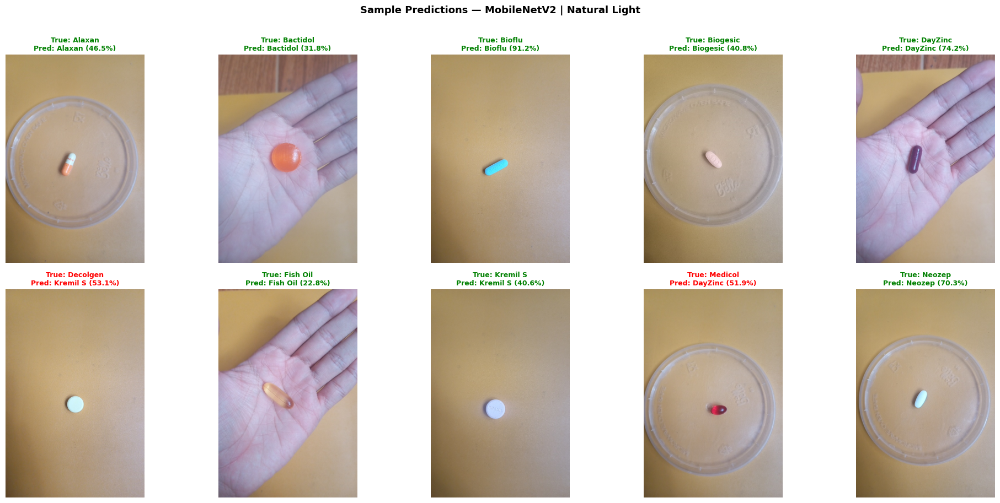

In [38]:
# ── Natural Light Evaluation───────────────────────
# Standard single-pass inference with the deterministic VAL_TEST_TRANSFORM
# (no test-time augmentation), consistent with the evaluation protocol.
results_natural = evaluate_dataset(
    test_dir       = NATURAL_TEST_DIR,
    dataset_label  = 'Natural Light',
    model          = model,
    transform      = VAL_TEST_TRANSFORM,
    class_names    = CLASS_NAMES,
    device         = CFG['device'],
    output_dir     = OUTPUT_DIR,
    save_prefix    = 'natural_light',
)

### Section 10c. Cross-Condition Summary and Domain Gap

In [39]:
# ── Cross-Condition Summary + Synthetic-to-Real Domain Gap ─────────────────
# Consolidates real-world performance and quantifies the domain gap vs. the
# synthetic test accuracy (thesis Tables 14 and 19).

print('=' * 75)
print('CROSS-CONDITION PERFORMANCE SUMMARY  --  MobileNetV2')
print('=' * 75)
print(f'{"Condition":<22}{"Accuracy":>10}{"Precision":>11}{"Recall":>9}{"F1":>9}{"ms/img":>9}')
print('-' * 75)
for label, res in [('Fluorescent Light', results_fluor), ('Natural Light', results_natural)]:
    print(f'{label:<22}{res["accuracy"]*100:>9.2f}%{res["precision"]*100:>10.2f}%'
          f'{res["recall"]*100:>8.2f}%{res["f1"]*100:>8.2f}%{res["avg_inf_ms"]:>9.2f}')
print('=' * 75)

# Condition summary CSV.
summary_rows = []
for label, res in [('Fluorescent_Light', results_fluor), ('Natural_Light', results_natural)]:
    summary_rows.append({'Condition': label, 'Accuracy': round(res['accuracy']*100, 2),
                         'Precision': round(res['precision']*100, 2),
                         'Recall': round(res['recall']*100, 2), 'F1_Score': round(res['f1']*100, 2),
                         'Avg_Inf_ms': round(res['avg_inf_ms'], 2)})
pd.DataFrame(summary_rows).to_csv(OUTPUT_DIR / 'condition_summary.csv', index=False)

# Synthetic-to-real domain gap (real - synthetic), in percentage points.
gap_rows = []
for label, res in [('Fluorescent', results_fluor), ('Natural', results_natural)]:
    real = res['accuracy'] * 100
    gap_rows.append({'Light_Condition': label, 'Synthetic_Acc': round(synth_acc*100, 2),
                     'Real_Acc': round(real, 2), 'Domain_Gap_pp': round(real - synth_acc*100, 2)})
df_gap = pd.DataFrame(gap_rows)
df_gap.to_csv(OUTPUT_DIR / 'domain_gap.csv', index=False)
print('\nSynthetic-to-Real Domain Gap (real − synthetic, percentage points):')
print(df_gap.to_string(index=False))

# Latency methodology note.
print('\nNote: latency is single-image (batch=1) on the Kaggle GPU and includes CPU')
print('preprocessing. It is NOT the on-device Flutter/TFLite latency on the target phone.')
print('Summaries saved: condition_summary.csv, domain_gap.csv')


CROSS-CONDITION PERFORMANCE SUMMARY  --  MobileNetV2
Condition               Accuracy  Precision   Recall       F1   ms/img
---------------------------------------------------------------------------
Fluorescent Light         91.33%     92.96%   91.33%   91.05%     9.53
Natural Light             64.00%     73.25%   64.00%   62.70%     9.52

Synthetic-to-Real Domain Gap (real − synthetic, percentage points):
Light_Condition  Synthetic_Acc  Real_Acc  Domain_Gap_pp
    Fluorescent           98.4     91.33          -7.07
        Natural           98.4     64.00         -34.40

Note: latency is single-image (batch=1) on the Kaggle GPU and includes CPU
preprocessing. It is NOT the on-device Flutter/TFLite latency on the target phone.
Summaries saved: condition_summary.csv, domain_gap.csv


---
## Section 10d. Batch Folder Inference — Per-Image Predictions

Runs the model over every image in the fluorescent and natural-light test folders and records the prediction for each one (true label, predicted label, confidence). It reuses `predict_single` and the deterministic `VAL_TEST_TRANSFORM` (no augmentation), so the results are consistent with Section 10a/10b. The full per-image table is saved to CSV per condition, and every misclassification is listed and shown as an errors-only grid — this is the quickest way to see *what* the model confuses under each lighting condition.

In [40]:
# ── Batch Folder Inference (per-image predictions; both conditions) ────────
# Diagnostic view that complements the Section 10 aggregates: a complete,
# deterministic per-image prediction listing plus an errors-only grid. Uses
# VAL_TEST_TRANSFORM only (no augmentation), consistent with evaluation.

def batch_folder_inference(test_dir, condition_label, model, transform,
                           class_names, device, output_dir, save_prefix):
    """Predict every image in a labelled folder tree and report/save per-image results."""
    test_dir, output_dir = Path(test_dir), Path(output_dir)
    rows = []

    for cls_name in sorted(class_names):                       # deterministic class order
        cls_path = test_dir / cls_name
        if not cls_path.exists():
            continue
        files = sorted(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')))  # deterministic
        for img_path in files:
            fname, pred_class, confidence, inf_ms = predict_single(
                img_path, model, transform, class_names, device)
            rows.append({
                'condition' : condition_label,
                'file'      : fname,
                'true'      : cls_name,
                'predicted' : pred_class,
                'confidence': confidence,         # softmax %, of the predicted class
                'inf_ms'    : inf_ms,
                'correct'   : (pred_class == cls_name),
            })

    df = pd.DataFrame(rows)
    n_total = len(df)
    n_correct = int(df['correct'].sum())
    acc = (n_correct / n_total * 100) if n_total else 0.0

    print(f'\n{"="*64}')
    print(f'  BATCH INFERENCE — {condition_label}')
    print(f'{"="*64}')
    print(f'  Images       : {n_total}')
    print(f'  Correct      : {n_correct}  ({acc:.2f}%)')
    print(f'  Misclassified: {n_total - n_correct}')

    # Per-class accuracy (quick scan of which classes struggle).
    print(f'\n  Per-class accuracy:')
    for cls_name in sorted(class_names):
        sub = df[df['true'] == cls_name]
        if len(sub):
            print(f'    {cls_name:<10}: {sub["correct"].sum():>2}/{len(sub):<2} '
                  f'({sub["correct"].mean()*100:5.1f}%)')

    # List every misclassification (true -> predicted @ confidence).
    errors = df[~df['correct']].reset_index(drop=True)
    if len(errors):
        print(f'\n  Misclassifications ({len(errors)}):')
        for _, r in errors.iterrows():
            print(f'    {r["file"]:<28} {r["true"]:<10} -> {r["predicted"]:<10} '
                  f'({r["confidence"]:.1f}%)')
    else:
        print('\n  No misclassifications in this condition.')

    # Save the full per-image table.
    csv_path = output_dir / f'{save_prefix}_predictions.csv'
    df.to_csv(csv_path, index=False)
    print(f'\n  Saved per-image predictions -> {csv_path.name}')

    # Errors-only grid (most informative; skipped if there are none).
    if len(errors):
        n = min(len(errors), 10)
        cols = 5
        rows_grid = (n + cols - 1) // cols
        fig, axes = plt.subplots(rows_grid, cols, figsize=(20, 4.2 * rows_grid))
        axes = np.array(axes).reshape(-1)
        for ax in axes:
            ax.axis('off')
        for k in range(n):
            r = errors.iloc[k]
            img_path = Path(test_dir) / r['true'] / r['file']
            axes[k].imshow(np.array(Image.open(img_path).convert('RGB')))
            axes[k].set_title(f'{r["true"]} -> {r["predicted"]}\n({r["confidence"]:.1f}%)',
                              fontsize=9, color='red', fontweight='bold')
            axes[k].axis('off')
        plt.suptitle(f'Misclassifications — MobileNetV2 | {condition_label}',
                     fontsize=13, fontweight='bold', y=1.01)
        plt.tight_layout()
        plt.savefig(output_dir / f'{save_prefix}_misclassifications.png',
                    dpi=150, bbox_inches='tight')
        plt.show()

    return df

print('batch_folder_inference() defined.')


batch_folder_inference() defined.



  BATCH INFERENCE — Fluorescent Light
  Images       : 150
  Correct      : 137  (91.33%)
  Misclassified: 13

  Per-class accuracy:
    Alaxan    : 14/15 ( 93.3%)
    Bactidol  :  8/15 ( 53.3%)
    Bioflu    : 15/15 (100.0%)
    Biogesic  : 15/15 (100.0%)
    DayZinc   : 15/15 (100.0%)
    Decolgen  : 15/15 (100.0%)
    Fish Oil  : 15/15 (100.0%)
    Kremil S  : 15/15 (100.0%)
    Medicol   : 13/15 ( 86.7%)
    Neozep    : 12/15 ( 80.0%)

  Misclassifications (13):
    Alaxan_FL_H (2).jpg          Alaxan     -> Fish Oil   (34.1%)
    Bactidol_FL_FS (4).jpg       Bactidol   -> Medicol    (34.7%)
    Bactidol_FL_H (4).jpg        Bactidol   -> Medicol    (41.4%)
    Bactidol_FL_TP (1).jpg       Bactidol   -> Medicol    (38.5%)
    Bactidol_FL_TP (2).jpg       Bactidol   -> Medicol    (42.7%)
    Bactidol_FL_TP (3).jpg       Bactidol   -> Medicol    (62.1%)
    Bactidol_FL_TP (4).jpg       Bactidol   -> Medicol    (40.8%)
    Bactidol_FL_TP (5).jpg       Bactidol   -> Medicol    (33.6%)


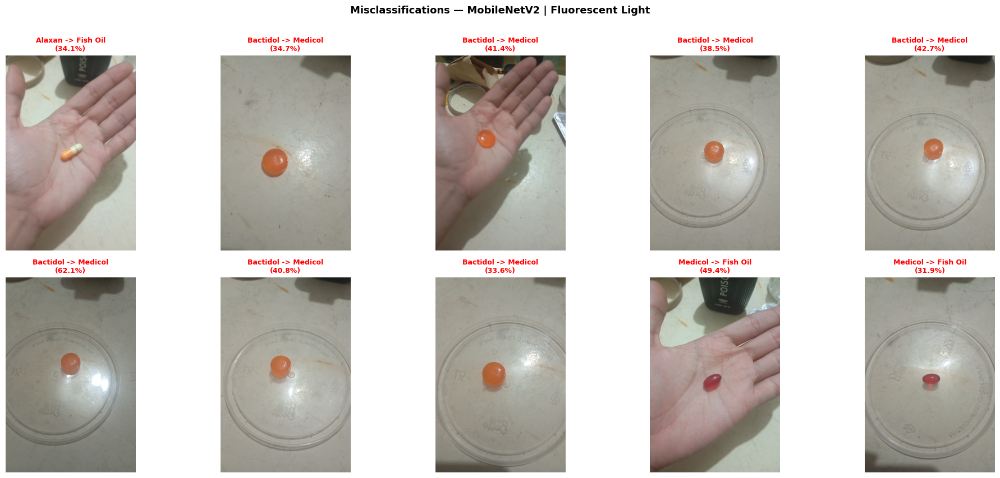


  BATCH INFERENCE — Natural Light
  Images       : 150
  Correct      : 96  (64.00%)
  Misclassified: 54

  Per-class accuracy:
    Alaxan    :  4/15 ( 26.7%)
    Bactidol  : 12/15 ( 80.0%)
    Bioflu    : 11/15 ( 73.3%)
    Biogesic  : 10/15 ( 66.7%)
    DayZinc   :  8/15 ( 53.3%)
    Decolgen  :  3/15 ( 20.0%)
    Fish Oil  : 14/15 ( 93.3%)
    Kremil S  : 14/15 ( 93.3%)
    Medicol   : 10/15 ( 66.7%)
    Neozep    : 10/15 ( 66.7%)

  Misclassifications (54):
    Alaxan_NL_FS (2).jpg         Alaxan     -> Neozep     (54.4%)
    Alaxan_NL_FS (3).jpg         Alaxan     -> Bioflu     (69.0%)
    Alaxan_NL_FS (4).jpg         Alaxan     -> Neozep     (26.1%)
    Alaxan_NL_FS (5).jpg         Alaxan     -> Bioflu     (50.1%)
    Alaxan_NL_H (1).jpg          Alaxan     -> Biogesic   (48.5%)
    Alaxan_NL_H (2).jpg          Alaxan     -> Biogesic   (35.4%)
    Alaxan_NL_H (4).jpg          Alaxan     -> Bioflu     (50.5%)
    Alaxan_NL_H (5).jpg          Alaxan     -> Biogesic   (45.9%)
    A

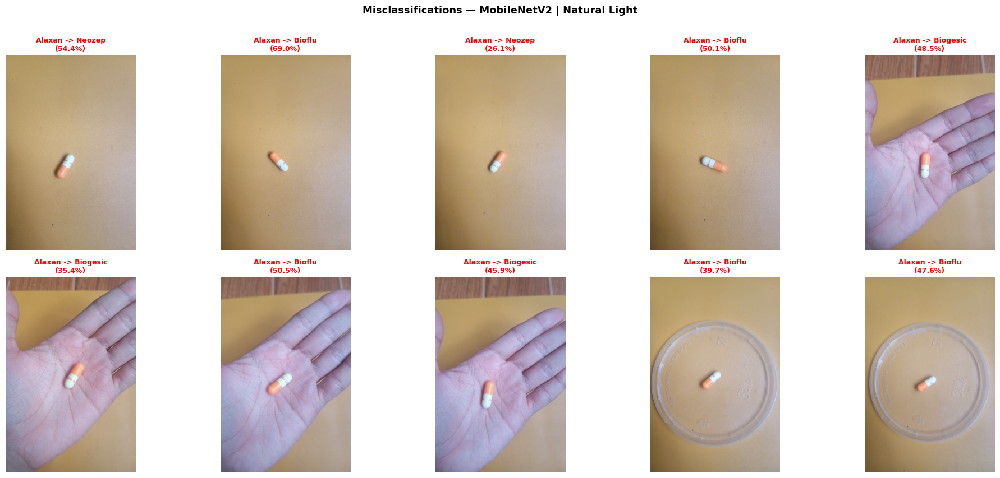


Combined predictions saved -> all_realworld_predictions.csv (300 images across both conditions)


In [41]:
# Run batch inference on BOTH lighting conditions and combine into one table.
df_fluor_pred = batch_folder_inference(
    FLUOR_TEST_DIR, 'Fluorescent Light', model, VAL_TEST_TRANSFORM,
    CLASS_NAMES, CFG['device'], OUTPUT_DIR, save_prefix='fluorescent_light')

df_natural_pred = batch_folder_inference(
    NATURAL_TEST_DIR, 'Natural Light', model, VAL_TEST_TRANSFORM,
    CLASS_NAMES, CFG['device'], OUTPUT_DIR, save_prefix='natural_light')

# Combined per-image CSV across both conditions.
df_all_pred = pd.concat([df_fluor_pred, df_natural_pred], ignore_index=True)
df_all_pred.to_csv(OUTPUT_DIR / 'all_realworld_predictions.csv', index=False)
print(f'\nCombined predictions saved -> all_realworld_predictions.csv '
      f'({len(df_all_pred)} images across both conditions)')


---
## Section 11. Single-Image Inference Demo

Using image: /kaggle/input/datasets/ncvaog/pills-dataset-test/Pill_tests/Fluorescent_light/Alaxan/Alaxan_FL_H (4).jpg

 Image       : Alaxan_FL_H (4).jpg
 Prediction  : Alaxan
 Confidence  : 40.2%
 Inference   : 9.20 ms


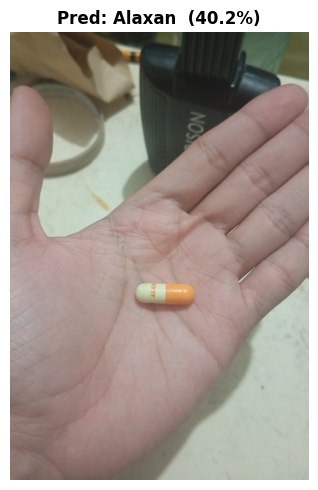

In [42]:
# ── Single-Image Inference Test ────────────────────────────────────────
# Dynamically picks a real image from the fluorescent test set.

# Auto-select: find the first available image under TEST_DIR
SINGLE_IMAGE_PATH = None
for cls_name in CLASS_NAMES:
    cls_folder = FLUOR_TEST_DIR / cls_name
    if cls_folder.exists():
        candidates = list(cls_folder.glob('*.jpg')) + list(cls_folder.glob('*.png'))
        if candidates:
            SINGLE_IMAGE_PATH = str(candidates[0])
            break

if SINGLE_IMAGE_PATH is None:
    raise FileNotFoundError(
        f'No images found under FLUOR_TEST_DIR: {FLUOR_TEST_DIR}\n'
        'Check that the Kaggle dataset is attached and the path is correct.'
    )

print(f'Using image: {SINGLE_IMAGE_PATH}')

fname, pred_class, confidence, inf_ms = predict_single(
    SINGLE_IMAGE_PATH, model, VAL_TEST_TRANSFORM, CLASS_NAMES, CFG['device']
)

print(f'\n Image       : {fname}')
print(f' Prediction  : {pred_class}')
print(f' Confidence  : {confidence:.1f}%')
print(f' Inference   : {inf_ms:.2f} ms')

# Display the image annotated with predicted class and confidence.
img_display = np.array(Image.open(SINGLE_IMAGE_PATH).convert('RGB'))
plt.figure(figsize=(5, 5))
plt.imshow(img_display)
plt.title(f'Pred: {pred_class}  ({confidence:.1f}%)', fontsize=12, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

---
## Section 10. TFLite Export (PyTorch to ONNX to TFLite)


In [43]:
# ── Write labels.txt (index -> class name) for the Flutter app & reproducibility ──
labels_path = OUTPUT_DIR / 'labels.txt'
with open(labels_path, 'w') as f:
    for name in CLASS_NAMES:
        f.write(name + '\n')
print('labels.txt written:', labels_path)
for i, name in enumerate(CLASS_NAMES):
    print(f'  {i}: {name}')


labels.txt written: /kaggle/working/medisina_output/labels.txt
  0: Alaxan
  1: Bactidol
  2: Bioflu
  3: Biogesic
  4: DayZinc
  5: Decolgen
  6: Fish Oil
  7: Kremil S
  8: Medicol
  9: Neozep


In [44]:
# ── Model Export: PyTorch → ONNX → TFLite ──────────────────────────────────
# Stage 1 exports the trained model to ONNX with the legacy tracer (weights are
# embedded, so the file is full-size, not a graph-only stub). Stage 2 converts to
# a TFLite flatbuffer for the MediSina Scan Flutter app. Both calls use only stable
# arguments, with fallbacks so the cell survives onnx2tf / torch version drift on
# Kaggle's image.

# Export dependencies (kept unpinned: onnx2tf must match Kaggle's TensorFlow build).
!pip install -q onnx2tf onnxsim sng4onnx onnxruntime onnx

import os, gc, glob, shutil, logging, warnings
import torch
import onnx
from pathlib import Path

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['CUDA_VISIBLE_DEVICES'] = ''          # force CPU for the TF/onnx2tf step
logging.getLogger('tensorflow').setLevel(logging.ERROR)
warnings.filterwarnings('ignore')

# Free GPU memory before the CPU-based export.
if 'optimizer' in dir():
    del optimizer
torch.cuda.empty_cache()
gc.collect()

OUTPUT_DIR   = Path('/kaggle/working/medisina_output')
ONNX_PATH    = str(OUTPUT_DIR / 'mobilenetv2.onnx')
TF_OUT_DIR   = str(OUTPUT_DIR / 'mobilenetv2_tf')
FINAL_TFLITE = str(OUTPUT_DIR / 'mobilenetv2.tflite')

# ── Stage 1: PyTorch → ONNX ────────────────────────────────────────────────
print('Step 1/2 - Exporting PyTorch model to ONNX...')
model.eval()
model.cpu()
dummy_input = torch.randn(1, 3, CFG['img_size'], CFG['img_size'])

# dynamo=False forces the legacy tracer, which embeds weights (avoids the tiny
# graph-only ONNX the new exporter can produce). Fixed batch=1 (single-image
# inference on device); opset 17 is the most onnx2tf-compatible.
try:
    torch.onnx.export(
        model, dummy_input, ONNX_PATH,
        export_params=True, opset_version=17, do_constant_folding=True,
        input_names=['input'], output_names=['output'], dynamo=False,
    )
except TypeError:  # older torch without the `dynamo` kwarg
    torch.onnx.export(
        model, dummy_input, ONNX_PATH,
        export_params=True, opset_version=17, do_constant_folding=True,
        input_names=['input'], output_names=['output'],
    )

onnx.checker.check_model(onnx.load(ONNX_PATH))     # structural validity
onnx_size = os.path.getsize(ONNX_PATH) / (1024 * 1024)
print(f'    ONNX saved -> {ONNX_PATH}  ({onnx_size:.2f} MB)')
if onnx_size < 3.0:
    print('    WARNING: ONNX is unexpectedly small (<3 MB) for a ~1.9M-param model.')
    print('             Weights may be externalised; check for a sidecar .onnx_data file.')

# ── Stage 2: ONNX → TFLite (onnx2tf) ───────────────────────────────────────
print('\nStep 2/2 - Converting ONNX -> TFLite via onnx2tf...')
import onnx2tf

# Use only stable kwargs; fall back to the minimal signature if the installed
# onnx2tf rejects them (its convert() signature changes between releases).
try:
    onnx2tf.convert(
        input_onnx_file_path=ONNX_PATH,
        output_folder_path=TF_OUT_DIR,
        copy_onnx_input_output_names_to_tflite=True,
    )
except TypeError:
    onnx2tf.convert(input_onnx_file_path=ONNX_PATH, output_folder_path=TF_OUT_DIR)

# onnx2tf emits several variants; deploy the float32 build for parity with PyTorch.
candidates = (glob.glob(f'{TF_OUT_DIR}/**/*float32.tflite', recursive=True)
              or glob.glob(f'{TF_OUT_DIR}/**/*.tflite', recursive=True))
if not candidates:
    raise FileNotFoundError(f'No .tflite produced. Contents of {TF_OUT_DIR}: '
                            f'{os.listdir(TF_OUT_DIR)}')
shutil.copy(candidates[0], FINAL_TFLITE)
tflite_size = os.path.getsize(FINAL_TFLITE) / (1024 * 1024)
print(f'    TFLite saved -> {FINAL_TFLITE}  ({tflite_size:.2f} MB)')

# ── Verify the TFLite model loads and has the expected I/O spec ────────────
print('\nVerifying TFLite model integrity...')
import tensorflow as tf
interpreter = tf.lite.Interpreter(model_path=FINAL_TFLITE)
interpreter.allocate_tensors()
inp = interpreter.get_input_details()[0]
out = interpreter.get_output_details()[0]
print(f"   Input  : {inp['shape']} | {inp['dtype']}")
print(f"   Output : {out['shape']} | {out['dtype']}")
print(f"\nEXPORT COMPLETE. Download '{Path(FINAL_TFLITE).name}' for the Flutter app.")
print(f'   ONNX   : {onnx_size:.2f} MB   |   TFLite : {tflite_size:.2f} MB')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.2/223.2 kB 5.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 36.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 34.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 78.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 63.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 55.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 86.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 77.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 28.0 MB/s e

flatbuffer_direct lowering:   0%|          | 0/100 [00:00<?, ?it/s]

flatbuffer_direct post-lowering:   0%|          | 0/6 [00:00<?, ?it/s]

flatbuffer_direct export:   0%|          | 0/3 [00:00<?, ?it/s]

flatbuffer_direct write timing: stage=float32 mode=builder_direct total=0.027s serialize=0.022s (sanitize=0.000s build=0.003s pack=0.017s output=0.001s) write=0.005s size=8.49MB
flatbuffer_direct write timing: stage=float16 mode=builder_direct total=0.017s serialize=0.015s (sanitize=0.000s build=0.002s pack=0.012s output=0.000s) write=0.002s size=4.26MB
Float32 tflite output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_float32.tflite)
Float16 tflite output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_float16.tflite)
Tensor correspondence report output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_tensor_correspondence_report.json)
Input/Output tensor names are directly written from ONNX graph in flatbuffer_direct backend.
    TFLite saved -> /kaggle/working/medisina_output/mobilenetv2.tflite  (8.49 MB)

Verifying TFLite model integrity...


E0000 00:00:1780450907.791702      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1780450907.857350      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1780450908.372607      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780450908.372627      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780450908.372631      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780450908.372633      58 computation_placer.cc:177] computation placer already registered. Please check linka

   Input  : [  1 256 256   3] | <class 'numpy.float32'>
   Output : [ 1 10] | <class 'numpy.float32'>

EXPORT COMPLETE. Download 'mobilenetv2.tflite' for the Flutter app.
   ONNX   : 8.50 MB   |   TFLite : 8.49 MB


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [45]:
# ── Mark TFLite export section complete ──────────────────────────────────
mark_section_complete("tflite_export", {
    "export_done"   : True,
    "onnx_size_mb"  : float(onnx_size),
    "tflite_size_mb": float(tflite_size),
})


  Section 'tflite_export' marked complete.


---
## Section 11. Flutter Integration Guide

### Output Files

After executing this notebook, the following files will be available in `/kaggle/working/medisina_output/`:

| File | Purpose |
|---|---|
| `mobilenetv2.tflite` | Trained model for on-device inference in Flutter |
| `labels.txt` | Class label mapping (index to class name) |
| `best_mobilenetv2.pth` | PyTorch checkpoint for retraining or evaluation |

### Flutter Integration Steps

**1. Add dependency to `pubspec.yaml`:**
```yaml
dependencies:
  tflite_flutter: ^0.10.4

flutter:
  assets:
    - assets/mobilenetv2.tflite
    - assets/labels.txt
```

**2. Asset directory structure:**
```
your_flutter_app/
└── assets/
    ├── mobilenetv2.tflite
    └── labels.txt
```

**3. Image preprocessing in Dart (must match Python normalisation exactly):**
```dart
// ImageNet channel-wise normalisation:
// mean = [0.485, 0.456, 0.406]
// std  = [0.229, 0.224, 0.225]
// formula: normalized = (pixel / 255.0 - mean) / std

// Input tensor shape  : [1, 256, 256, 3]  (NHWC layout for TFLite)
// Output tensor shape : [1, 10]  (class logits; apply argmax for prediction)
```

**4. Input image size:** Resize all input images to **256 x 256 pixels** prior to inference.


In [46]:
# ── Final Experiment Results Summary ───────────────────────────────────
# Prints a consolidated summary of all key evaluation metrics and
# lists all generated output files with their sizes.
print('=' * 70)
print('MEDISINA SCAN -- MobileNetV2 FINAL RESULTS SUMMARY')
print('=' * 70)
print(f'Model              : MobileNetV2')
print(f'Best Val Accuracy  : {best_val_acc*100:.2f}%')
print()
print('Real-World Test Results:')
print(f'  Fluorescent  — Accuracy: {results_fluor["accuracy"]*100:.2f}%  '
      f'Precision: {results_fluor["precision"]*100:.2f}%  '
      f'Recall: {results_fluor["recall"]*100:.2f}%  '
      f'F1: {results_fluor["f1"]*100:.2f}%')
print(f'  Natural      — Accuracy: {results_natural["accuracy"]*100:.2f}%  '
      f'Precision: {results_natural["precision"]*100:.2f}%  '
      f'Recall: {results_natural["recall"]*100:.2f}%  '
      f'F1: {results_natural["f1"]*100:.2f}%')
print(f'TFLite Model Size  : {tflite_size:.2f} MB')
print('=' * 70)
print('\n Output files saved to:', OUTPUT_DIR)
for f in sorted(OUTPUT_DIR.iterdir()):
    size = f.stat().st_size
    unit = 'KB' if size < 1024*1024 else 'MB'
    val  = size/1024 if size < 1024*1024 else size/(1024*1024)
    print(f'   {f.name:<45} {val:.1f} {unit}')

MEDISINA SCAN -- MobileNetV2 FINAL RESULTS SUMMARY
Model              : MobileNetV2
Best Val Accuracy  : 98.87%

Real-World Test Results:
  Fluorescent  — Accuracy: 91.33%  Precision: 92.96%  Recall: 91.33%  F1: 91.05%
  Natural      — Accuracy: 64.00%  Precision: 73.25%  Recall: 64.00%  F1: 62.70%
TFLite Model Size  : 8.49 MB

 Output files saved to: /kaggle/working/medisina_output
   all_realworld_predictions.csv                 20.6 KB
   augmentation_preview.png                      1.4 MB
   best_mobilenetv2.pth                          26.0 MB
   class_distribution.png                        80.8 KB
   condition_summary.csv                         0.1 KB
   domain_gap.csv                                0.1 KB
   fluorescent_light_confusion_matrix.png        142.0 KB
   fluorescent_light_misclassifications.png      1.9 MB
   fluorescent_light_predictions.csv             10.6 KB
   fluorescent_light_sample_predictions.png      2.2 MB
   labels.txt                                   

---
## Section 13. Comprehensive Results Summary (Thesis-Oriented)

Generates a complete Results-and-Discussion summary **from the real run artifacts** produced above — training/validation logs, the held-out synthetic test, both real-world conditions, and the batch-inference tables. It reports learning behaviour, best epoch, convergence and stability, overall and class-wise performance, confusion-matrix findings, a misclassification analysis, the synthetic-to-real domain gap, and deployment-level metrics. Output is printed and saved to `RESULTS_AND_DISCUSSION.md` (+ supporting CSVs) for direct inclusion in the thesis. No values are hard-coded; everything is computed live.

In [47]:
# ── Comprehensive Thesis Results Summary (computed from real artifacts) ────
import numpy as np, pandas as pd
from pathlib import Path
from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_recall_fscore_support, accuracy_score)

def _per_class_table(labels, preds, class_names):
    """Per-class precision/recall/F1/support as a DataFrame (percent)."""
    p, r, f, s = precision_recall_fscore_support(
        labels, preds, labels=list(range(len(class_names))), zero_division=0)
    return pd.DataFrame({
        'Class': class_names,
        'Precision': (p * 100).round(2),
        'Recall': (r * 100).round(2),
        'F1': (f * 100).round(2),
        'Support': s.astype(int),
    })

def _confusion_findings(labels, preds, class_names, top=6):
    """Largest off-diagonal confusions as 'True -> Pred (n)' strings."""
    cm = confusion_matrix(labels, preds, labels=list(range(len(class_names))))
    pairs = []
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            if i != j and cm[i, j] > 0:
                pairs.append((cm[i, j], class_names[i], class_names[j]))
    pairs.sort(reverse=True)
    return cm, [f'{t} -> {p} ({n})' for n, t, p in pairs[:top]]

def generate_results_summary(output_dir, class_names, model_label='MobileNetV2'):
    out = []
    W = out.append
    output_dir = Path(output_dir)

    W(f'# Results and Discussion — {model_label}\n')

    W('## 1. Experimental Configuration\n')
    W(f'- Backbone: `{CFG["model_name"]}` | Input: {CFG["img_size"]}x{CFG["img_size"]} '
      f'| Classes: {CFG["num_classes"]}\n')
    W(f'- Split (synthetic): {int(CFG["train_split"]*100)}/{int(CFG["val_split"]*100)}/'
      f'{int(CFG["synth_test_split"]*100)} train/val/test, stratified, seed {SEED}\n')
    W(f'- Optimiser: AdamW, weight decay {CFG["weight_decay"]}, label smoothing '
      f'{CFG["label_smooth"]}; class weights Decolgen 2.2 / Alaxan 1.6\n')
    W('- Augmentation (training split only): spatial flips/affine, cast-shadow, '
      'exposure/gamma/tone, mild colour-temperature drift, lens flare, and sensor noise\n')
    W(f'- Real-world test: 300 images (150 fluorescent + 150 natural), preprocessing only\n')

    # ── Training & validation behaviour ───────────────────────────────────
    W('\n## 2. Training and Validation Behaviour\n')
    try:
        combined = phase1_log + phase2_log
    except NameError:
        combined = []
    if combined:
        tr_acc = [e['train_acc'] * 100 for e in combined]
        va_acc = [e['val_acc'] * 100 for e in combined]
        tr_loss = [e['train_loss'] for e in combined]
        va_loss = [e['val_loss'] for e in combined]
        n1 = len(phase1_log)
        best_i = int(np.argmax(va_acc))
        last5 = va_acc[-5:] if len(va_acc) >= 5 else va_acc
        overfit_gap = tr_acc[best_i] - va_acc[best_i]
        W(f'- Total epochs run: {len(combined)} (Phase 1: {n1} frozen-head warm-up, '
          f'Phase 2: {len(phase2_log)} full fine-tuning)\n')
        W(f'- **Best validation accuracy: {va_acc[best_i]:.2f}% at epoch {best_i+1}** '
          f'({"Phase 1" if best_i < n1 else "Phase 2"})\n')
        W(f'- Train/val accuracy at best epoch: {tr_acc[best_i]:.2f}% / {va_acc[best_i]:.2f}% '
          f'(generalisation gap {overfit_gap:+.2f} pp)\n')
        W(f'- Final-5-epoch val accuracy: min {min(last5):.2f}%, max {max(last5):.2f}%, '
          f'std {np.std(last5):.2f} pp (stability indicator)\n')
        W(f'- Validation loss: start {va_loss[0]:.4f} -> best-epoch {va_loss[best_i]:.4f} '
          f'-> final {va_loss[-1]:.4f}\n')
        W(f'- Convergence: training accuracy moved {tr_acc[0]:.1f}% -> {max(tr_acc):.1f}%; '
          f'the Phase 1->2 unfreeze at epoch {n1} is the main inflection point.\n')
        # Persist the epoch log as CSV for a thesis figure/table.
        pd.DataFrame({'epoch': range(1, len(combined)+1),
                      'train_loss': tr_loss, 'val_loss': va_loss,
                      'train_acc': tr_acc, 'val_acc': va_acc}
                     ).to_csv(output_dir / 'training_log.csv', index=False)
        W('- Per-epoch log saved to `training_log.csv`; curves in `training_curves.png`.\n')
    else:
        W('- Training logs not in memory (Phase 1 may have been skipped by the session '
          'guard). Re-run both phases in one session to populate this section.\n')

    # ── Synthetic test (in-distribution) ───────────────────────────────────
    W('\n## 3. Synthetic Test Set (In-Distribution)\n')
    if 'results_synth' in globals():
        sl, sp = results_synth['labels'], results_synth['preds']
        sacc = results_synth['accuracy'] * 100
        pr, rc, f1, _ = precision_recall_fscore_support(sl, sp, average='weighted', zero_division=0)
        W(f'- Overall accuracy: **{sacc:.2f}%** | weighted P/R/F1: '
          f'{pr*100:.2f}% / {rc*100:.2f}% / {f1*100:.2f}% | n = {len(sl)}\n')
        tbl = _per_class_table(sl, sp, class_names)
        tbl.to_csv(output_dir / 'synth_per_class.csv', index=False)
        W('\n**Per-class (synthetic):**\n\n')
        W(tbl.to_markdown(index=False) + '\n')
        worst = tbl.sort_values('F1').iloc[0]
        W(f'\n- Strongest/weakest class by F1: {tbl.sort_values("F1").iloc[-1]["Class"]} '
          f'({tbl["F1"].max():.2f}%) vs {worst["Class"]} ({worst["F1"]:.2f}%).\n')
    else:
        W('- `results_synth` not found — run the synthetic-test cell (Section 9).\n')

    # ── Real-world conditions ──────────────────────────────────────────────
    W('\n## 4. Real-World Test Performance\n')
    cond = []
    for label, var in [('Fluorescent', 'results_fluor'), ('Natural', 'results_natural')]:
        if var in globals():
            r = globals()[var]
            cond.append({'Condition': label,
                         'Accuracy': round(r['accuracy']*100, 2),
                         'Precision': round(r['precision']*100, 2),
                         'Recall': round(r['recall']*100, 2),
                         'F1': round(r['f1']*100, 2),
                         'ms/img': round(r['avg_inf_ms'], 2)})
    if cond:
        dfc = pd.DataFrame(cond)
        W(dfc.to_markdown(index=False) + '\n')
        # Domain gap vs synthetic.
        if 'results_synth' in globals():
            sacc = results_synth['accuracy'] * 100
            W('\n**Synthetic-to-real domain gap (real - synthetic):**\n\n')
            gap = pd.DataFrame([{'Condition': c['Condition'],
                                 'Synthetic': round(sacc, 2),
                                 'Real': c['Accuracy'],
                                 'Gap_pp': round(c['Accuracy'] - sacc, 2)} for c in cond])
            gap.to_csv(output_dir / 'domain_gap.csv', index=False)
            W(gap.to_markdown(index=False) + '\n')
            worst = gap.sort_values('Gap_pp').iloc[0]
            W(f'\n- Largest gap: {worst["Condition"]} ({worst["Gap_pp"]:.2f} pp), the '
              f'primary deployment limitation.\n')
    else:
        W('- Real-world results not in memory — run Section 10.\n')

    # ── Class-wise + confusion + misclassification per condition ───────────
    W('\n## 5. Class-Wise Performance and Confusion Findings\n')
    for label, var in [('Fluorescent', 'results_fluor'), ('Natural', 'results_natural')]:
        if var not in globals():
            continue
        r = globals()[var]
        lab, prd = r['labels'], r['preds']
        W(f'\n### {label} Light\n')
        tbl = _per_class_table(lab, prd, class_names)
        tbl.to_csv(output_dir / f'{label.lower()}_per_class.csv', index=False)
        W(tbl.to_markdown(index=False) + '\n')
        perfect = tbl[tbl['F1'] == 100]['Class'].tolist()
        weak = tbl.sort_values('F1').head(3)
        W(f'\n- Perfect-F1 classes: {", ".join(perfect) if perfect else "none"}.\n')
        W(f'- Weakest 3 by F1: '
          f'{", ".join(f"{x.Class} ({x.F1:.1f}%)" for x in weak.itertuples())}.\n')
        _, findings = _confusion_findings(lab, prd, class_names)
        W(f'- Top confusions: {"; ".join(findings) if findings else "none"}.\n')

    # ── Batch folder inference ─────────────────────────────────────────────
    W('\n## 6. Batch Folder Inference (Per-Image)\n')
    if 'df_fluor_pred' in globals() and 'df_natural_pred' in globals():
        comb = pd.concat([df_fluor_pred, df_natural_pred], ignore_index=True)
        for label, d in [('Fluorescent', df_fluor_pred), ('Natural', df_natural_pred),
                         ('Combined', comb)]:
            n, ok = len(d), int(d['correct'].sum())
            mean_conf_ok = d.loc[d['correct'], 'confidence'].mean()
            mean_conf_err = d.loc[~d['correct'], 'confidence'].mean() if (n - ok) else float('nan')
            W(f'- {label}: {ok}/{n} correct ({ok/n*100:.2f}%); mean confidence '
              f'{mean_conf_ok:.1f}% (correct) vs {mean_conf_err:.1f}% (errors).\n')
        # Misclassification analysis (combined).
        errs = comb[~comb['correct']]
        W(f'\n**Misclassification analysis ({len(errs)} errors across both conditions):**\n')
        if len(errs):
            by_true = errs['true'].value_counts()
            W(f'- Most-missed true classes: '
              f'{", ".join(f"{k} ({v})" for k, v in by_true.head(5).items())}.\n')
            confused = (errs['true'] + ' -> ' + errs['predicted']).value_counts()
            W(f'- Most frequent error pairs: '
              f'{", ".join(f"{k} ({v})" for k, v in confused.head(6).items())}.\n')
            hi = errs[errs['confidence'] >= 80]
            W(f'- High-confidence errors (>=80%): {len(hi)} '
              f'({len(hi)/len(errs)*100:.0f}% of errors) — these are the riskiest for a '
              f'medical app, since the model is confidently wrong.\n')
            comb.to_csv(output_dir / 'all_realworld_predictions.csv', index=False)
            W('- Full per-image table: `all_realworld_predictions.csv`.\n')
        else:
            W('- No misclassifications.\n')
    else:
        W('- Batch-inference tables not in memory — run Section 10d.\n')

    # ── Deployment ─────────────────────────────────────────────────────────
    W('\n## 7. Deployment-Level Inference\n')
    tfl = output_dir / 'mobilenetv2.tflite'
    if tfl.exists():
        W(f'- Exported TFLite size: {tfl.stat().st_size/1e6:.2f} MB '
          f'(float32, weights embedded).\n')
    lat = [globals()[v]['avg_inf_ms'] for v in ('results_fluor', 'results_natural')
           if v in globals()]
    if lat:
        W(f'- Mean single-image latency (Kaggle GPU, incl. preprocessing): '
          f'{np.mean(lat):.2f} ms/image. NOTE: not the on-device Flutter/TFLite latency.\n')

    # ── Key observations ───────────────────────────────────────────────────
    W('\n## 8. Key Observations and Limitations\n')
    W('- The model fits the synthetic distribution strongly; the limiting factor is the '
      'synthetic-to-real domain gap, which is widest under natural light.\n')
    W('- Errors concentrate in a few visually/colour-similar classes (see Section 5); '
      'high-confidence errors, if present, are the main safety concern for deployment.\n')
    W('- Real-world test sets are small (150 images/condition; 1 image ~= 0.67 pp), so '
      'differences of a few points are within noise and should be reported with that caveat.\n')

    text = ''.join(out)
    (output_dir / 'RESULTS_AND_DISCUSSION.md').write_text(text)
    return text

_summary_text = generate_results_summary(OUTPUT_DIR, CLASS_NAMES, model_label='MobileNetV2')
print(_summary_text)
print('\nSaved: RESULTS_AND_DISCUSSION.md, training_log.csv, synth_per_class.csv,')
print('       fluorescent_per_class.csv, natural_per_class.csv, domain_gap.csv,')
print('       all_realworld_predictions.csv')


# Results and Discussion — MobileNetV2
## 1. Experimental Configuration
- Backbone: `mobilenetv2_100.ra_in1k` | Input: 256x256 | Classes: 10
- Split (synthetic): 70/15/15 train/val/test, stratified, seed 42
- Optimiser: AdamW, weight decay 0.0001, label smoothing 0.1; class weights Decolgen 2.2 / Alaxan 1.6
- Augmentation (training split only): spatial flips/affine, cast-shadow, exposure/gamma/tone, mild colour-temperature drift, lens flare, and sensor noise
- Real-world test: 300 images (150 fluorescent + 150 natural), preprocessing only

## 2. Training and Validation Behaviour
- Total epochs run: 115 (Phase 1: 15 frozen-head warm-up, Phase 2: 100 full fine-tuning)
- **Best validation accuracy: 98.87% at epoch 105** (Phase 2)
- Train/val accuracy at best epoch: 82.32% / 98.87% (generalisation gap -16.54 pp)
- Final-5-epoch val accuracy: min 98.67%, max 98.73%, std 0.03 pp (stability indicator)
- Validation loss: start 2.3564 -> best-epoch 0.5746 -> final 0.5694
- Convergence: training

---
## Appendix A. Kaggle Dataset Backup / Restore (operational)

Optional utilities to persist outputs across Kaggle sessions. Not part of the experiment.

In [48]:
# ── Output Directory Inspection ────────────────────────────────────────
# Lists all files produced during this experiment session with their
# sizes and a summary of the persisted session state.
print("Files in output directory:")
total_bytes = 0
for p in sorted(OUTPUT_DIR.rglob("*")):
    if p.is_file():
        sz = p.stat().st_size
        total_bytes += sz
        unit = "MB" if sz > 1_048_576 else "KB"
        val  = sz / 1_048_576 if sz > 1_048_576 else sz / 1024
        print(f"  {str(p.relative_to(OUTPUT_DIR)):<52}  {val:6.1f} {unit}")
print(f"\n  Total: {total_bytes/1e6:.2f} MB")

print("\nSession state:")
state = load_session_state()
for k, v in state.items():
    print(f"  {k:<24}: {v}")


Files in output directory:
  RESULTS_AND_DISCUSSION.md                                6.2 KB
  all_realworld_predictions.csv                           20.6 KB
  augmentation_preview.png                                 1.4 MB
  best_mobilenetv2.pth                                    26.0 MB
  class_distribution.png                                  80.8 KB
  condition_summary.csv                                    0.1 KB
  domain_gap.csv                                           0.1 KB
  fluorescent_light_confusion_matrix.png                 142.0 KB
  fluorescent_light_misclassifications.png                 1.9 MB
  fluorescent_light_predictions.csv                       10.6 KB
  fluorescent_light_sample_predictions.png                 2.2 MB
  fluorescent_per_class.csv                                0.3 KB
  labels.txt                                               0.1 KB
  mobilenetv2.onnx                                         8.5 MB
  mobilenetv2.tflite                             

### Section 12b. Push Outputs to Kaggle Dataset


In [49]:
# =====================================================================
# Push Output Directory to Kaggle Dataset
# Execute this cell before closing the session to back up all
# checkpoints and outputs to a persistent private Kaggle dataset.
# =====================================================================
# Set your Kaggle dataset slug:
KAGGLE_DATASET_SLUG = None   # e.g.  "your-username/medisina-output"

backup_to_kaggle_dataset(KAGGLE_DATASET_SLUG)


KAGGLE_DATASET_SLUG is not set. Skipping backup.
Set it to e.g. "your-username/medisina-output" and re-run.


### Section 12c. Restore from Kaggle Dataset (New Session)

When starting a new Kaggle session, attach your backup dataset via
*Add Data* in the right sidebar, set the `RESTORE_FROM` variable below,
and execute this cell to restore all checkpoints and logs.


In [50]:
# ── Restore Output Directory from Kaggle Dataset Backup ────────────────
# After attaching the backup dataset via the Kaggle UI (Add Data),
# it becomes accessible at /kaggle/input/<dataset-slug>/.
# This cell copies all files from the backup into OUTPUT_DIR and
# prompts re-execution of the Session Recovery Manager cell.

RESTORE_FROM = None  # e.g. Path("/kaggle/input/medisina-output/medisina_output")

if RESTORE_FROM and Path(RESTORE_FROM).exists():
    src = Path(RESTORE_FROM)
    print(f"Restoring from {src} ...")
    restored = 0
    for file in src.rglob("*"):
        if file.is_file():
            dest = OUTPUT_DIR / file.relative_to(src)
            dest.parent.mkdir(parents=True, exist_ok=True)
            shutil.copy2(str(file), str(dest))
            print(f"  {dest.relative_to(OUTPUT_DIR)}")
            restored += 1
    print(f"\nRestored {restored} files to {OUTPUT_DIR}")
    print("Re-run the Session Recovery Manager cell to load state.")
else:
    print("RESTORE_FROM is not set or the path does not exist.")
    print("Steps:")
    print("  1. Add your backup dataset via Kaggle UI (Add Data)")
    print("  2. Set RESTORE_FROM to the /kaggle/input/... path")
    print("  3. Re-run this cell")


RESTORE_FROM is not set or the path does not exist.
Steps:
  1. Add your backup dataset via Kaggle UI (Add Data)
  2. Set RESTORE_FROM to the /kaggle/input/... path
  3. Re-run this cell


---
## Section 14. Consolidated Results Export (Machine-Readable)

Consolidates every key output — configuration, training settings, training/validation history, synthetic and real-world test metrics, per-class performance, confusion-matrix metrics, batch-inference results, and overall findings — into a single structured JSON file (`consolidated_results.json`) plus a compact Markdown twin (`consolidated_results.md`). The JSON is designed to be imported and analysed by another system without reading the notebook.


In [51]:
# ── Consolidated Results Export (single structured report) ─────────────────
import json as _json, numpy as _np
from datetime import datetime, timezone
from pathlib import Path
from sklearn.metrics import (confusion_matrix, precision_recall_fscore_support,
                             classification_report)

def _safe(v):
    """Recursively convert numpy types to plain Python for JSON serialisation."""
    if isinstance(v, dict):
        return {k: _safe(x) for k, x in v.items()}
    if isinstance(v, (list, tuple)):
        return [_safe(x) for x in v]
    if isinstance(v, (_np.integer,)):
        return int(v)
    if isinstance(v, (_np.floating,)):
        return round(float(v), 4)
    if isinstance(v, _np.ndarray):
        return v.tolist()
    return v

def _per_class(labels, preds, names):
    p, r, f, sup = precision_recall_fscore_support(
        labels, preds, labels=list(range(len(names))), zero_division=0)
    return [{'class': names[i], 'precision': round(float(p[i]*100), 2),
             'recall': round(float(r[i]*100), 2), 'f1': round(float(f[i]*100), 2),
             'support': int(sup[i])} for i in range(len(names))]

def _confusion_block(labels, preds, names):
    cm = confusion_matrix(labels, preds, labels=list(range(len(names))))
    offdiag = []
    for i in range(len(names)):
        for j in range(len(names)):
            if i != j and cm[i, j] > 0:
                offdiag.append({'true': names[i], 'predicted': names[j],
                                'count': int(cm[i, j])})
    offdiag.sort(key=lambda d: d['count'], reverse=True)
    return {'matrix': cm.tolist(), 'labels': names, 'top_confusions': offdiag[:10]}

report = {}

# ── Metadata ───────────────────────────────────────────────────────────────
report['meta'] = {
    'project': 'MediSina Scan — Pharmaceutical Drug Image Classification',
    'model': MODEL_LABEL,
    'timm_id': CFG['model_name'],
    'generated_utc': datetime.now(timezone.utc).isoformat(timespec='seconds'),
    'class_names': CLASS_NAMES,
    'num_classes': CFG['num_classes'],
}

# ── Configuration & training settings ───────────────────────────────────────
report['configuration'] = {
    'img_size': CFG['img_size'], 'batch_size': CFG['batch_size'],
    'optimizer': 'AdamW', 'weight_decay': CFG['weight_decay'],
    'label_smoothing': CFG['label_smooth'],
    'class_weights': {'Decolgen': 2.2, 'Alaxan': 1.6},
    'phase1': {'epochs': PHASE1_EPOCHS, 'lr': PHASE1_LR, 'frozen_backbone': True},
    'phase2': {'max_epochs': PHASE2_EPOCHS, 'lr': PHASE2_LR,
               'patience': PHASE2_PATIENCE,
               'scheduler': 'CosineAnnealingWarmRestarts(T_0=10, T_mult=2, eta_min=1e-7)'},
    'split': {'train': CFG['train_split'], 'val': CFG['val_split'],
              'synth_test': CFG['synth_test_split'], 'seed': SEED},
    'augmentation': ['horizontal/vertical flip', 'shift-scale-rotate', 'random shadow',
                     'brightness/contrast', 'tone curve', 'colour-temperature jitter',
                     'gamma', 'hue/sat/val (small)', 'specular-highlight overlay',
                     'CLAHE', 'color jitter', 'gaussian blur', 'sun flare',
                     'channel dropout', 'ISO noise', 'MixUp/CutMix'],
    'augmentation_scope': 'training split only; val/test use preprocessing only',
}

# ── Training & validation history ───────────────────────────────────────────
try:
    combined = phase1_log + phase2_log
except NameError:
    combined = []
if combined:
    va = [e['val_acc']*100 for e in combined]
    ta = [e['train_acc']*100 for e in combined]
    best_i = int(_np.argmax(va))
    n1 = len(phase1_log)
    tail = va[-5:] if len(va) >= 5 else va
    report['training'] = {
        'total_epochs': len(combined),
        'phase1_epochs': n1, 'phase2_epochs': len(phase2_log),
        'best_val_acc': round(va[best_i], 2),
        'best_epoch': best_i + 1,
        'best_epoch_phase': 1 if best_i < n1 else 2,
        'train_acc_at_best': round(ta[best_i], 2),
        'generalisation_gap_pp': round(ta[best_i] - va[best_i], 2),
        'final5_val_std_pp': round(float(_np.std(tail)), 3),
        'final5_val_min': round(min(tail), 2),
        'final5_val_max': round(max(tail), 2),
        'per_epoch': [{'epoch': e['epoch'], 'train_loss': round(e['train_loss'], 4),
                       'val_loss': round(e['val_loss'], 4),
                       'train_acc': round(e['train_acc']*100, 2),
                       'val_acc': round(e['val_acc']*100, 2)} for e in combined],
    }
else:
    report['training'] = {'note': 'training logs not in memory (session guard may have '
                          'skipped Phase 1; re-run both phases in one session)'}

# ── Synthetic test (in-distribution) ────────────────────────────────────────
if 'results_synth' in globals():
    sl, sp = results_synth['labels'], results_synth['preds']
    pr, rc, f1, _ = precision_recall_fscore_support(sl, sp, average='weighted', zero_division=0)
    report['synthetic_test'] = {
        'accuracy': round(results_synth['accuracy']*100, 2),
        'precision': round(pr*100, 2), 'recall': round(rc*100, 2), 'f1': round(f1*100, 2),
        'n': len(sl),
        'per_class': _per_class(sl, sp, CLASS_NAMES),
        'confusion': _confusion_block(sl, sp, CLASS_NAMES),
    }

# ── Real-world test metrics + domain gap ────────────────────────────────────
report['real_world'] = {}
synth_acc_val = report.get('synthetic_test', {}).get('accuracy')
for cond, var in [('fluorescent', 'results_fluor'), ('natural', 'results_natural')]:
    if var in globals():
        r = globals()[var]
        block = {
            'accuracy': round(r['accuracy']*100, 2),
            'precision': round(r['precision']*100, 2),
            'recall': round(r['recall']*100, 2),
            'f1': round(r['f1']*100, 2),
            'avg_inference_ms': round(r['avg_inf_ms'], 2),
            'per_class': _per_class(r['labels'], r['preds'], CLASS_NAMES),
            'confusion': _confusion_block(r['labels'], r['preds'], CLASS_NAMES),
        }
        if synth_acc_val is not None:
            block['domain_gap_pp'] = round(block['accuracy'] - synth_acc_val, 2)
        report['real_world'][cond] = block

# ── Batch folder inference ──────────────────────────────────────────────────
if 'df_fluor_pred' in globals() and 'df_natural_pred' in globals():
    comb = pd.concat([df_fluor_pred, df_natural_pred], ignore_index=True)
    bi = {}
    for label, d in [('fluorescent', df_fluor_pred), ('natural', df_natural_pred),
                     ('combined', comb)]:
        n, ok = len(d), int(d['correct'].sum())
        errs = d[~d['correct']]
        bi[label] = {
            'images': n, 'correct': ok, 'accuracy': round(ok/n*100, 2) if n else 0.0,
            'misclassified': int(n - ok),
            'mean_conf_correct': round(float(d.loc[d['correct'], 'confidence'].mean()), 2) if ok else None,
            'mean_conf_error': round(float(errs['confidence'].mean()), 2) if len(errs) else None,
            'high_conf_errors_ge80': int((errs['confidence'] >= 80).sum()),
        }
    err_all = comb[~comb['correct']]
    bi['most_missed_classes'] = (err_all['true'].value_counts().head(5).to_dict()
                                 if len(err_all) else {})
    bi['top_error_pairs'] = ((err_all['true'] + ' -> ' + err_all['predicted'])
                             .value_counts().head(10).to_dict() if len(err_all) else {})
    report['batch_inference'] = bi

# ── Deployment ───────────────────────────────────────────────────────────────
tflite = OUTPUT_DIR / f'{MODEL_FILE_STEM}.tflite'
report['deployment'] = {
    'tflite_size_mb': round(tflite.stat().st_size/1e6, 2) if tflite.exists() else None,
    'tflite_file': tflite.name,
    'labels_file': 'labels.txt',
}

# ── Key findings (auto-derived) ──────────────────────────────────────────────
findings = []
rw = report.get('real_world', {})
if 'fluorescent' in rw and 'natural' in rw:
    findings.append(f"Real-world accuracy: fluorescent {rw['fluorescent']['accuracy']}%, "
                    f"natural {rw['natural']['accuracy']}%.")
    if 'domain_gap_pp' in rw['natural']:
        findings.append(f"Natural-light domain gap is {rw['natural']['domain_gap_pp']} pp "
                        f"(largest source of real-world error).")
if 'training' in report and 'best_epoch' in report['training']:
    findings.append(f"Best validation accuracy {report['training']['best_val_acc']}% at "
                    f"epoch {report['training']['best_epoch']}.")
findings.append("Real-world test sets are small (150 images/condition; 1 image ~= 0.67 pp); "
                "differences of a few points are within noise.")
report['key_findings'] = findings

# ── Write JSON + compact Markdown twin ───────────────────────────────────────
report = _safe(report)
json_path = OUTPUT_DIR / 'consolidated_results.json'
json_path.write_text(_json.dumps(report, indent=2))

def _md_table(rows, headers):
    line = '| ' + ' | '.join(headers) + ' |\n| ' + ' | '.join(['---']*len(headers)) + ' |\n'
    for r in rows:
        line += '| ' + ' | '.join(str(x) for x in r) + ' |\n'
    return line

md = [f"# Consolidated Results — {report['meta']['model']}\n",
      f"_Generated {report['meta']['generated_utc']}_\n",
      "\n## Key Findings\n"] + [f"- {x}\n" for x in report['key_findings']]
if 'training' in report and 'best_val_acc' in report['training']:
    t = report['training']
    md += ["\n## Training\n",
           f"- Best val accuracy: **{t['best_val_acc']}%** (epoch {t['best_epoch']}, "
           f"phase {t['best_epoch_phase']})\n",
           f"- Generalisation gap: {t['generalisation_gap_pp']} pp | "
           f"final-5 val std: {t['final5_val_std_pp']} pp\n"]
if 'synthetic_test' in report:
    st = report['synthetic_test']
    md += ["\n## Synthetic Test\n",
           f"- Accuracy {st['accuracy']}% | P/R/F1 {st['precision']}/{st['recall']}/{st['f1']}%\n"]
if rw:
    md += ["\n## Real-World Test\n",
           _md_table([[c.title(), b['accuracy'], b['precision'], b['recall'], b['f1'],
                       b.get('domain_gap_pp', '-')] for c, b in rw.items()],
                     ['Condition', 'Acc', 'Prec', 'Recall', 'F1', 'Gap_pp'])]
if 'batch_inference' in report:
    bi = report['batch_inference']
    md += ["\n## Batch Inference (combined)\n",
           f"- {bi['combined']['correct']}/{bi['combined']['images']} correct "
           f"({bi['combined']['accuracy']}%); high-confidence errors (>=80%): "
           f"{bi['combined']['high_conf_errors_ge80']}\n"]
(OUTPUT_DIR / 'consolidated_results.md').write_text(''.join(md))

print('Consolidated report written:')
print(f'  {json_path.name}  ({json_path.stat().st_size/1024:.1f} KB)')
print(f'  consolidated_results.md')
print('\nTop-level JSON keys:', list(report.keys()))


Consolidated report written:
  consolidated_results.json  (33.7 KB)
  consolidated_results.md

Top-level JSON keys: ['meta', 'configuration', 'training', 'synthetic_test', 'real_world', 'batch_inference', 'deployment', 'key_findings']
